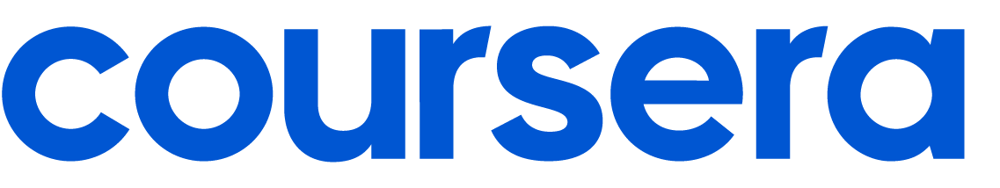

# Welcome to the Data Science Coding Challange!

Test your skills in a real-world coding challenge. Coding Challenges provide CS & DS Coding Competitions with Prizes and achievement badges!

CS & DS learners want to be challenged as a way to evaluate if they’re job ready. So, why not create fun challenges and give winners something truly valuable such as complimentary access to select Data Science courses, or the ability to receive an achievement badge on their Coursera Skills Profile - highlighting their performance to recruiters.

## Introduction

In this challenge, you'll get the opportunity to tackle one of the most industry-relevant maching learning problems with a unique dataset that will put your modeling skills to the test. Subscription services are leveraged by companies across many industries, from fitness to video streaming to retail. One of the primary objectives of companies with subscription services is to decrease churn and ensure that users are retained as subscribers. In order to do this efficiently and systematically, many companies employ machine learning to predict which users are at the highest risk of churn, so that proper interventions can be effectively deployed to the right audience.

In this challenge, we will be tackling the churn prediction problem on a very unique and interesting group of subscribers on a video streaming service! 

Imagine that you are a new data scientist at this video streaming company and you are tasked with building a model that can predict which existing subscribers will continue their subscriptions for another month. We have provided a dataset that is a sample of subscriptions that were initiated in 2021, all snapshotted at a particular date before the subscription was cancelled. Subscription cancellation can happen for a multitude of reasons, including:
* the customer completes all content they were interested in, and no longer need the subscription
* the customer finds themselves to be too busy and cancels their subscription until a later time
* the customer determines that the streaming service is not the best fit for them, so they cancel and look for something better suited

Regardless the reason, this video streaming company has a vested interest in understanding the likelihood of each individual customer to churn in their subscription so that resources can be allocated appropriately to support customers. In this challenge, you will use your machine learning toolkit to do just that!

## Understanding the Datasets

### Train vs. Test
In this competition, you’ll gain access to two datasets that are samples of past subscriptions of a video streaming platform that contain information about the customer, the customers streaming preferences, and their activity in the subscription thus far. One dataset is titled `train.csv` and the other is titled `test.csv`.

`train.csv` contains 70% of the overall sample (243,787 subscriptions to be exact) and importantly, will reveal whether or not the subscription was continued into the next month (the “ground truth”).

The `test.csv` dataset contains the exact same information about the remaining segment of the overall sample (104,480 subscriptions to be exact), but does not disclose the “ground truth” for each subscription. It’s your job to predict this outcome!

Using the patterns you find in the `train.csv` data, predict whether the subscriptions in `test.csv` will be continued for another month, or not.

### Dataset descriptions
Both `train.csv` and `test.csv` contain one row for each unique subscription. For each subscription, a single observation (`CustomerID`) is included during which the subscription was active. 

In addition to this identifier column, the `train.csv` dataset also contains the target label for the task, a binary column `Churn`.

Besides that column, both datasets have an identical set of features that can be used to train your model to make predictions. Below you can see descriptions of each feature. Familiarize yourself with them so that you can harness them most effectively for this machine learning task!

In [1]:
import pandas as pd
data_descriptions = pd.read_csv('data_descriptions.csv')
pd.set_option('display.max_colwidth', None)
data_descriptions

,Column_name,Column_type,Data_type,Description
0,AccountAge,Feature,integer,The age of the user's account in months.
1,MonthlyCharges,Feature,float,The amount charged to the user on a monthly basis.
2,TotalCharges,Feature,float,The total charges incurred by the user over the account's lifetime.
3,SubscriptionType,Feature,object,"The type of subscription chosen by the user (Basic, Standard, or Premium)."
4,PaymentMethod,Feature,string,The method of payment used by the user.
5,PaperlessBilling,Feature,string,Indicates whether the user has opted for paperless billing (Yes or No).
6,ContentType,Feature,string,"The type of content preferred by the user (Movies, TV Shows, or Both)."
7,MultiDeviceAccess,Feature,string,Indicates whether the user has access to the service on multiple devices (Yes or No).
8,DeviceRegistered,Feature,string,"The type of device registered by the user (TV, Mobile, Tablet, or Computer)."
9,ViewingHoursPerWeek,Feature,float,The number of hours the user spends watching content per week.


## How to Submit your Predictions to Coursera
Submission Format:

In this notebook you should follow the steps below to explore the data, train a model using the data in `train.csv`, and then score your model using the data in `test.csv`. Your final submission should be a dataframe (call it `prediction_df` with two columns and exactly 104,480 rows (plus a header row). The first column should be `CustomerID` so that we know which prediction belongs to which observation. The second column should be called `predicted_probability` and should be a numeric column representing the __likellihood that the subscription will churn__.

Your submission will show an error if you have extra columns (beyond `CustomerID` and `predicted_probability`) or extra rows. The order of the rows does not matter.

The naming convention of the dataframe and columns are critical for our autograding, so please make sure to use the exact naming conventions of `prediction_df` with column names `CustomerID` and `predicted_probability`!

To determine your final score, we will compare your `predicted_probability` predictions to the source of truth labels for the observations in `test.csv` and calculate the [ROC AUC](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_auc_score.html). We choose this metric because we not only want to be able to predict which subscriptions will be retained, but also want a well-calibrated likelihood score that can be used to target interventions and support most accurately.

## Import Python Modules

First, import the primary modules that will be used in this project. Remember as this is an open-ended project please feel free to make use of any of your favorite libraries that you feel may be useful for this challenge. For example some of the following popular packages may be useful:

- pandas
- numpy
- Scipy
- Scikit-learn
- keras
- maplotlib
- seaborn
- etc, etc

In [2]:
# Import required packages

# Data packages
import numpy as np

# Machine Learning / Classification packages
from sklearn.metrics import roc_auc_score
from sklearn.model_selection import train_test_split
from sklearn.dummy import DummyClassifier as dmy

# Visualization Packages
from matplotlib import pyplot as plt
import seaborn as sns
%matplotlib inline


In [96]:
# Import any other packages you may want to use

# sklearn modules for data preprocessing:
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.preprocessing import StandardScaler

# sklearn modules for dimensionality reduction
#from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
#from sklearn.manifold import TSNE
#from sklearn.pipeline import Pipeline

# sklearn modules for feature selection
#from sklearn.feature_selection import RFE
#from sklearn.feature_selection import SelectKBest, chi2
from sklearn.ensemble import GradientBoostingClassifier
#import xgboost as xgb
#from sklearn.inspection import permutation_importance
#import lime
#import lime.lime_tabular

#sklearn modules for Model Selection:
#from sklearn.linear_model import LogisticRegression
#from sklearn.svm import SVC
#from sklearn.neighbors import KNeighborsClassifier
#from sklearn.naive_bayes import GaussianNB
#from sklearn.tree import DecisionTreeClassifier
#from sklearn.ensemble import RandomForestClassifier
#from sklearn.model_selection import cross_val_score, KFold


#sklearn modules for Model Evaluation & Improvement:
#from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn import model_selection
#from sklearn.model_selection import KFold
from sklearn.metrics import confusion_matrix, accuracy_score 
from sklearn.metrics import f1_score, precision_score, recall_score, fbeta_score
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import GridSearchCV
from imblearn.under_sampling import RandomUnderSampler
#from sklearn.model_selection import LeaveOneOut

# İstatistiksel Testler
from scipy.stats import shapiro, kstest, anderson
import scipy.stats as stats
#import plotly.express as px

#Standard libraries for data visualization:
#import matplotlib.ticker as mtick
#import seaborn as sns

## Load the Data

Let's start by loading the dataset `train.csv` into a dataframe `train_df`, and `test.csv` into a dataframe `test_df` and display the shape of the dataframes.

In [5]:
train_df = pd.read_csv("train.csv")
print('train_df Shape:', train_df.shape)
train_df.head()

train_df Shape: (243787, 21)


,AccountAge,MonthlyCharges,TotalCharges,SubscriptionType,PaymentMethod,PaperlessBilling,ContentType,MultiDeviceAccess,DeviceRegistered,ViewingHoursPerWeek,...,ContentDownloadsPerMonth,GenrePreference,UserRating,SupportTicketsPerMonth,Gender,WatchlistSize,ParentalControl,SubtitlesEnabled,CustomerID,Churn
0,20,11.055215,221.104302,Premium,Mailed check,No,Both,No,Mobile,36.758104,...,10,Sci-Fi,2.176498,4,Male,3,No,No,CB6SXPNVZA,0
1,57,5.175208,294.986882,Basic,Credit card,Yes,Movies,No,Tablet,32.450568,...,18,Action,3.478632,8,Male,23,No,Yes,S7R2G87O09,0
2,73,12.106657,883.785952,Basic,Mailed check,Yes,Movies,No,Computer,7.395160,...,23,Fantasy,4.238824,6,Male,1,Yes,Yes,EASDC20BDT,0
3,32,7.263743,232.439774,Basic,Electronic check,No,TV Shows,No,Tablet,27.960389,...,30,Drama,4.276013,2,Male,24,Yes,Yes,NPF69NT69N,0
4,57,16.953078,966.325422,Premium,Electronic check,Yes,TV Shows,No,TV,20.083397,...,20,Comedy,3.616170,4,Female,0,No,No,4LGYPK7VOL,0


In [6]:
test_df = pd.read_csv("test.csv")
print('test_df Shape:', test_df.shape)
test_df.head()

test_df Shape: (104480, 20)


,AccountAge,MonthlyCharges,TotalCharges,SubscriptionType,PaymentMethod,PaperlessBilling,ContentType,MultiDeviceAccess,DeviceRegistered,ViewingHoursPerWeek,AverageViewingDuration,ContentDownloadsPerMonth,GenrePreference,UserRating,SupportTicketsPerMonth,Gender,WatchlistSize,ParentalControl,SubtitlesEnabled,CustomerID
0,38,17.869374,679.036195,Premium,Mailed check,No,TV Shows,No,TV,29.126308,122.274031,42,Comedy,3.522724,2,Male,23,No,No,O1W6BHP6RM
1,77,9.912854,763.289768,Basic,Electronic check,Yes,TV Shows,No,TV,36.873729,57.093319,43,Action,2.021545,2,Female,22,Yes,No,LFR4X92X8H
2,5,15.019011,75.095057,Standard,Bank transfer,No,TV Shows,Yes,Computer,7.601729,140.414001,14,Sci-Fi,4.806126,2,Female,22,No,Yes,QM5GBIYODA
3,88,15.357406,1351.451692,Standard,Electronic check,No,Both,Yes,Tablet,35.586430,177.002419,14,Comedy,4.943900,0,Female,23,Yes,Yes,D9RXTK2K9F
4,91,12.406033,1128.949004,Standard,Credit card,Yes,TV Shows,Yes,Tablet,23.503651,70.308376,6,Drama,2.846880,6,Female,0,No,No,ENTCCHR1LR


## Explore, Clean, Validate, and Visualize the Data (optional)

Feel free to explore, clean, validate, and visualize the data however you see fit for this competition to help determine or optimize your predictive model. Please note - the final autograding will only be on the accuracy of the `prediction_df` predictions.

### Explore and Clean Data

In [7]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 243787 entries, 0 to 243786
Data columns (total 21 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   AccountAge                243787 non-null  int64  
 1   MonthlyCharges            243787 non-null  float64
 2   TotalCharges              243787 non-null  float64
 3   SubscriptionType          243787 non-null  object 
 4   PaymentMethod             243787 non-null  object 
 5   PaperlessBilling          243787 non-null  object 
 6   ContentType               243787 non-null  object 
 7   MultiDeviceAccess         243787 non-null  object 
 8   DeviceRegistered          243787 non-null  object 
 9   ViewingHoursPerWeek       243787 non-null  float64
 10  AverageViewingDuration    243787 non-null  float64
 11  ContentDownloadsPerMonth  243787 non-null  int64  
 12  GenrePreference           243787 non-null  object 
 13  UserRating                243787 non-null  f

In [8]:
train_df.describe()

,AccountAge,MonthlyCharges,TotalCharges,ViewingHoursPerWeek,AverageViewingDuration,ContentDownloadsPerMonth,UserRating,SupportTicketsPerMonth,WatchlistSize,Churn
count,243787.000000,243787.000000,243787.000000,243787.000000,243787.000000,243787.000000,243787.000000,243787.000000,243787.000000,243787.000000
mean,60.083758,12.490695,750.741017,20.502179,92.264061,24.503513,3.002713,4.504186,12.018508,0.181232
std,34.285143,4.327615,523.073273,11.243753,50.505243,14.421174,1.155259,2.872548,7.193034,0.385211
min,1.000000,4.990062,4.991154,1.000065,5.000547,0.000000,1.000007,0.000000,0.000000,0.000000
25%,30.000000,8.738543,329.147027,10.763953,48.382395,12.000000,2.000853,2.000000,6.000000,0.000000
50%,60.000000,12.495555,649.878487,20.523116,92.249992,24.000000,3.002261,4.000000,12.000000,0.000000
75%,90.000000,16.238160,1089.317362,30.219396,135.908048,37.000000,4.002157,7.000000,18.000000,0.000000
max,119.000000,19.989957,2378.723844,39.999723,179.999275,49.000000,4.999989,9.000000,24.000000,1.000000


In [9]:
test_df.describe()

,AccountAge,MonthlyCharges,TotalCharges,ViewingHoursPerWeek,AverageViewingDuration,ContentDownloadsPerMonth,UserRating,SupportTicketsPerMonth,WatchlistSize
count,104480.000000,104480.000000,104480.000000,104480.000000,104480.000000,104480.000000,104480.000000,104480.000000,104480.000000
mean,60.064692,12.474347,748.167669,20.489914,92.646128,24.450900,3.000958,4.507705,12.040400
std,34.285025,4.331734,520.782838,11.243173,50.631406,14.451309,1.154689,2.876700,7.204115
min,1.000000,4.990051,5.019144,1.000528,5.000985,0.000000,1.000016,0.000000,0.000000
25%,30.000000,8.725621,328.961543,10.767551,48.554662,12.000000,2.000577,2.000000,6.000000
50%,60.000000,12.453073,649.385029,20.472305,92.533168,25.000000,2.997293,5.000000,12.000000
75%,90.000000,16.214247,1081.266991,30.196107,136.622615,37.000000,4.000671,7.000000,18.000000
max,119.000000,19.989797,2376.235183,39.999296,179.999785,49.000000,4.999930,9.000000,24.000000


#### Check missing data:

In [10]:
train_df.isnull().sum()

AccountAge                  0
MonthlyCharges              0
TotalCharges                0
SubscriptionType            0
PaymentMethod               0
PaperlessBilling            0
ContentType                 0
MultiDeviceAccess           0
DeviceRegistered            0
ViewingHoursPerWeek         0
AverageViewingDuration      0
ContentDownloadsPerMonth    0
GenrePreference             0
UserRating                  0
SupportTicketsPerMonth      0
Gender                      0
WatchlistSize               0
ParentalControl             0
SubtitlesEnabled            0
CustomerID                  0
Churn                       0
dtype: int64

In [11]:
test_df.isnull().sum()

AccountAge                  0
MonthlyCharges              0
TotalCharges                0
SubscriptionType            0
PaymentMethod               0
PaperlessBilling            0
ContentType                 0
MultiDeviceAccess           0
DeviceRegistered            0
ViewingHoursPerWeek         0
AverageViewingDuration      0
ContentDownloadsPerMonth    0
GenrePreference             0
UserRating                  0
SupportTicketsPerMonth      0
Gender                      0
WatchlistSize               0
ParentalControl             0
SubtitlesEnabled            0
CustomerID                  0
dtype: int64

#### Check target variable distribution

In [12]:
print("Churn : \n",train_df["Churn"].value_counts())

Churn : 
 0    199605
1     44182
Name: Churn, dtype: int64


### Data Manupulation

In [13]:
# count the number of categorical variables and numerical variables
categorical = [var for var in train_df.columns if train_df[var].dtype=='O']
numerical = [var for var in train_df.columns if train_df[var].dtype!='O']

print('There are {} categorical variables'.format(len(categorical)))
print('There are {} numerical variables'.format(len(numerical)))

There are 11 categorical variables
There are 10 numerical variables


In [14]:
#MonthlyCharges
train_df['MonthlyCharges'] = train_df['MonthlyCharges'].round(2)
#TotalCharges
train_df['TotalCharges'] = train_df['TotalCharges'].round(2)

#ViewingHoursPerWeek
train_df['ViewingHoursPerWeek'] = train_df['ViewingHoursPerWeek'].astype(int)
#AverageViewingDuration
train_df['AverageViewingDuration'] = train_df['AverageViewingDuration'].astype(int)
#UserRating
train_df['UserRating'] = train_df['UserRating'].astype(int)

#MonthlyCharges 
test_df['MonthlyCharges'] = test_df['MonthlyCharges'].round(2)
#TotalCharges 
test_df['TotalCharges'] = test_df['TotalCharges'].round(2)

#ViewingHoursPerWeek 
test_df['ViewingHoursPerWeek'] = test_df['ViewingHoursPerWeek'].astype(int)
#AverageViewingDuration
test_df['AverageViewingDuration'] = test_df['AverageViewingDuration'].astype(int)
#UserRating
test_df['UserRating'] = test_df['UserRating'].astype(int)

#### Label Encode Binary data: 

In [15]:
#Create a label encoder object
le = LabelEncoder()
# Label Encoding will be used for columns with 2 or less unique values
le_count = 0
for col in train_df.columns[1:]:
    if train_df[col].dtype == 'object':
        if len(list(train_df[col].unique())) <= 2:
            le.fit(train_df[col])
            train_df[col] = le.transform(train_df[col])
            le_count += 1
print('{} columns were label encoded.'.format(le_count))

5 columns were label encoded.


In [16]:
# Label Encoding will be used for columns with 2 or less unique values
le_count = 0
for col in test_df.columns[1:]:
    if test_df[col].dtype == 'object':
        if len(list(test_df[col].unique())) <= 2:
            le.fit(test_df[col])
            test_df[col] = le.transform(test_df[col])
            le_count += 1
print('{} columns were label encoded.'.format(le_count))

5 columns were label encoded.


### Visualize the Data

#### Analyze the distribution of numeric Columns:

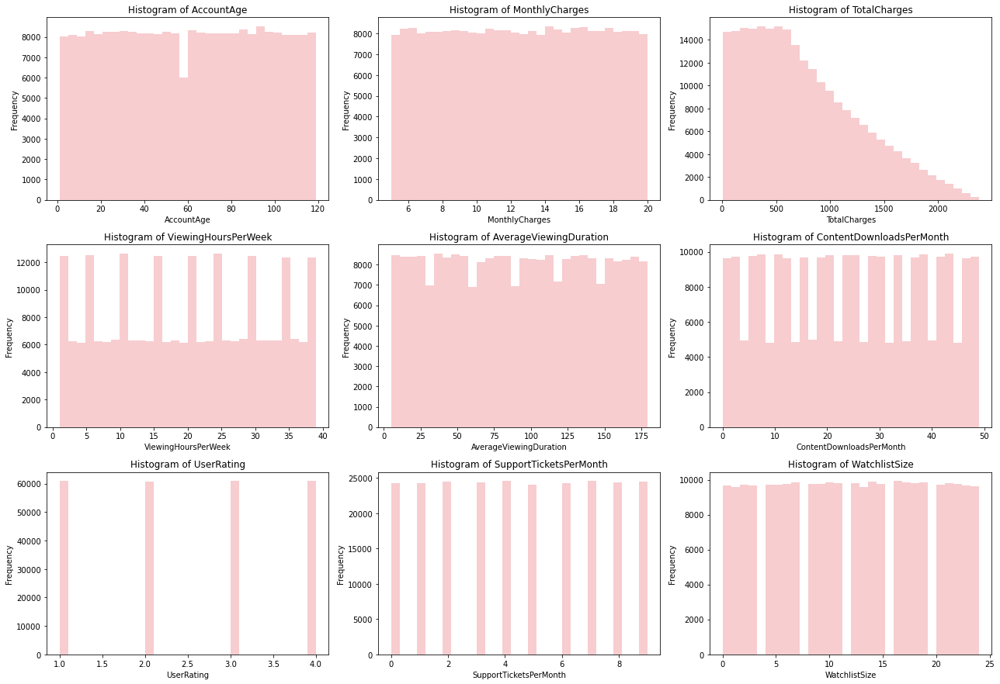

In [17]:
# Select numeric variables
numeric_vars_train = train_df[['AccountAge', 'MonthlyCharges', 'TotalCharges', 'ViewingHoursPerWeek', 'AverageViewingDuration', 
                         'ContentDownloadsPerMonth', 'UserRating', 'SupportTicketsPerMonth', 
                         'WatchlistSize']]

# Create histograms for each numeric variable
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(18, 16))
axes = axes.flatten()  # Flatten the axes array for easy iteration

for i, var in enumerate(numeric_vars_train.columns):
    sns.distplot(numeric_vars_train[var], bins=30, kde=False, color='#ec838a', ax=axes[i])
    axes[i].set_title(f'Histogram of {var}')
    axes[i].set_xlabel(var)
    axes[i].set_ylabel('Frequency')

# Remove any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

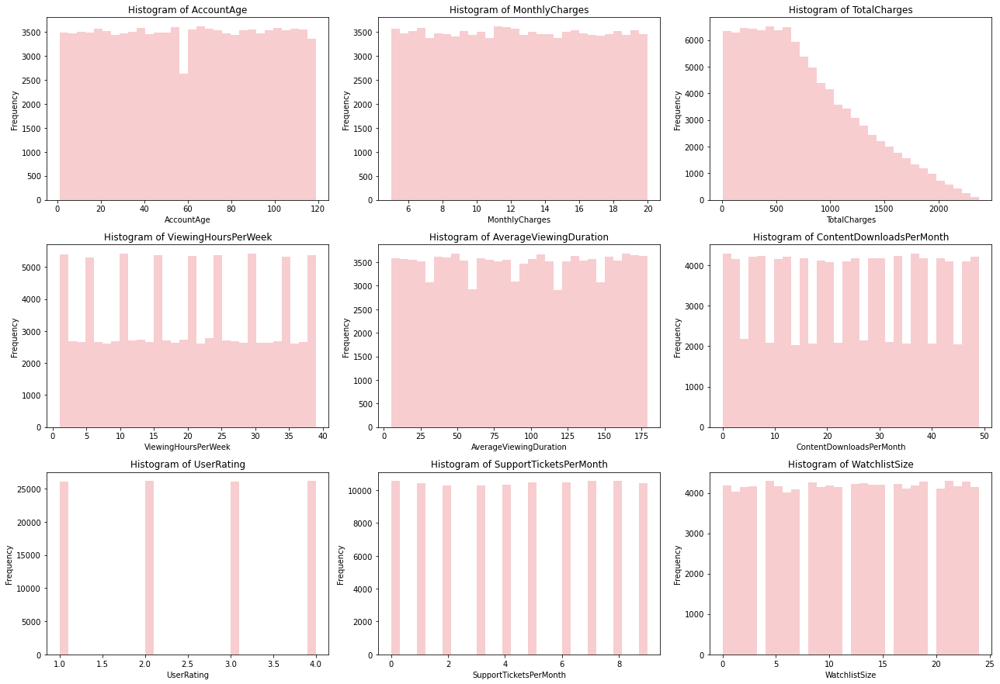

In [18]:
# Select numeric variables
numeric_vars_test = test_df[['AccountAge', 'MonthlyCharges', 'TotalCharges', 'ViewingHoursPerWeek', 'AverageViewingDuration', 
                         'ContentDownloadsPerMonth', 'UserRating', 'SupportTicketsPerMonth', 
                         'WatchlistSize']]

# Create histograms for each numeric variable
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(18, 16))
axes = axes.flatten()  # Flatten the axes array for easy iteration

for i, var in enumerate(numeric_vars_test.columns):
    sns.distplot(numeric_vars_test[var], bins=30, kde=False, color='#ec838a', ax=axes[i])
    axes[i].set_title(f'Histogram of {var}')
    axes[i].set_xlabel(var)
    axes[i].set_ylabel('Frequency')

# Remove any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

#### Analyze the churn rate by numeric variables

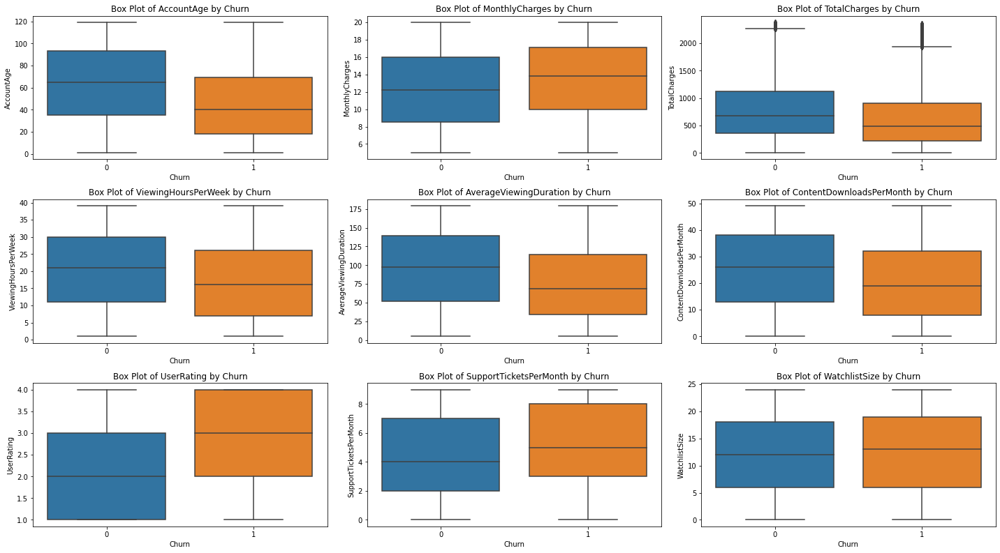

In [19]:
# Create box plots for each numeric variable
plt.figure(figsize=(20, 18))
for i, var in enumerate(numeric_vars_train, 1):
    plt.subplot(5, 3, i)
    sns.boxplot(x='Churn', y=var, data=train_df)
    plt.title(f'Box Plot of {var} by Churn')
plt.tight_layout()
plt.show()

# YORUM EKLE

#### Analyze the distribution of categorical variables:

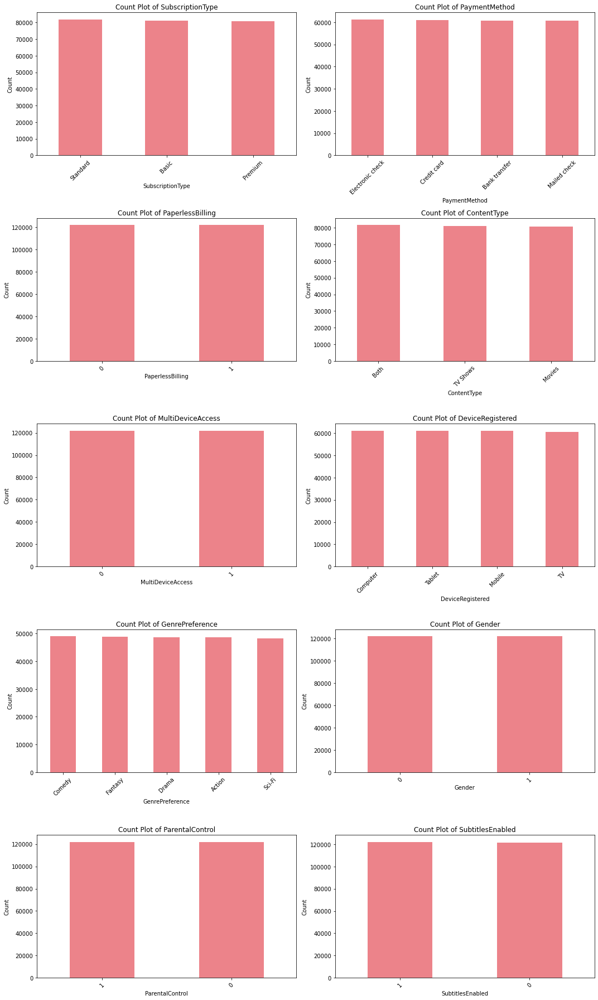

In [20]:
# List of categorical variables
categorical_vars = ['SubscriptionType', 'PaymentMethod', 'PaperlessBilling', 'ContentType', 'MultiDeviceAccess', 
                    'DeviceRegistered', 'GenrePreference', 'Gender', 'ParentalControl', 'SubtitlesEnabled']

# Create bar plots for each categorical variable
fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(15, 25))
axes = axes.flatten()  # Flatten the axes array for easy iteration

for i, var in enumerate(categorical_vars):
    train_df[var].value_counts().plot(kind='bar', ax=axes[i], color='#ec838a')
    axes[i].set_title(f'Count Plot of {var}')
    axes[i].set_xlabel(var)
    axes[i].set_ylabel('Count')
    axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=45)

# Remove any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

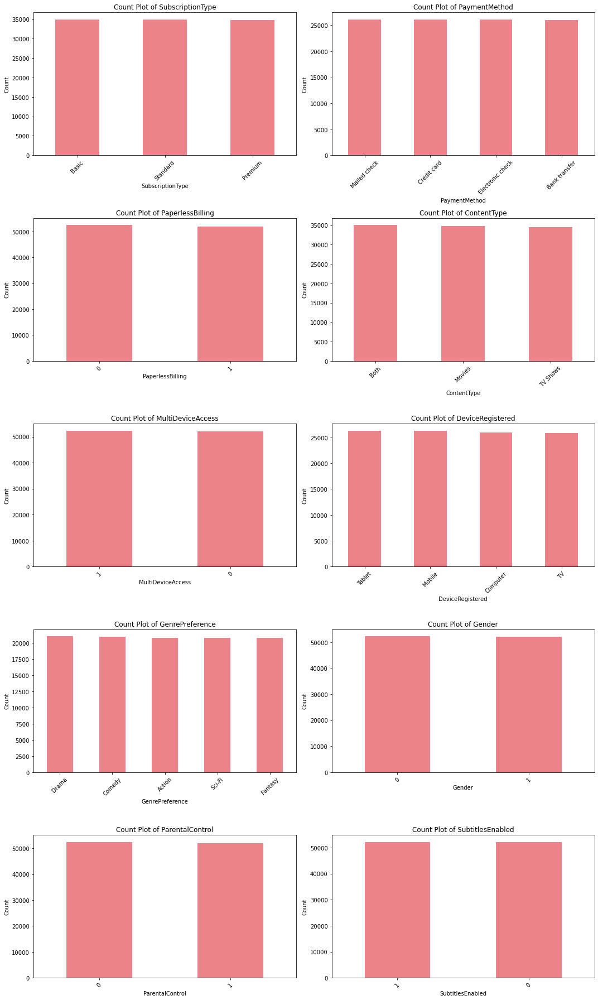

In [21]:
# Create bar plots for each categorical variable
fig, axes = plt.subplots(nrows=5, ncols=2, figsize=(15, 25))
axes = axes.flatten()  # Flatten the axes array for easy iteration

for i, var in enumerate(categorical_vars):
    test_df[var].value_counts().plot(kind='bar', ax=axes[i], color='#ec838a')
    axes[i].set_title(f'Count Plot of {var}')
    axes[i].set_xlabel(var)
    axes[i].set_ylabel('Count')
    axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=45)

# Remove any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

#### Analyze the churn rate by categorical variables

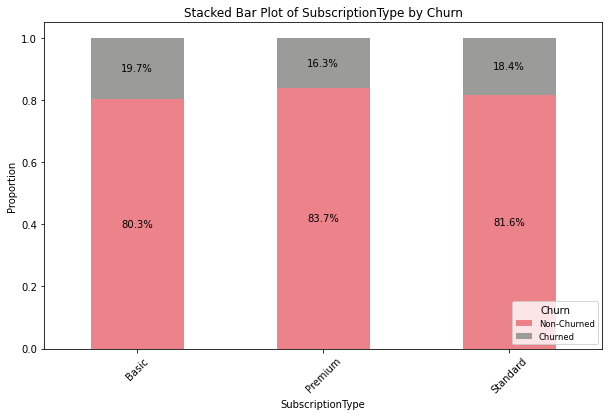

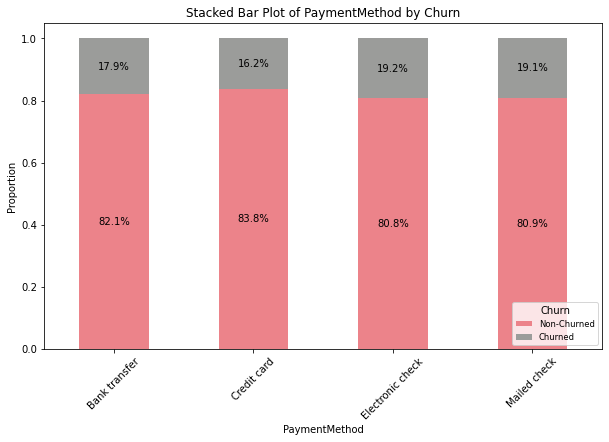

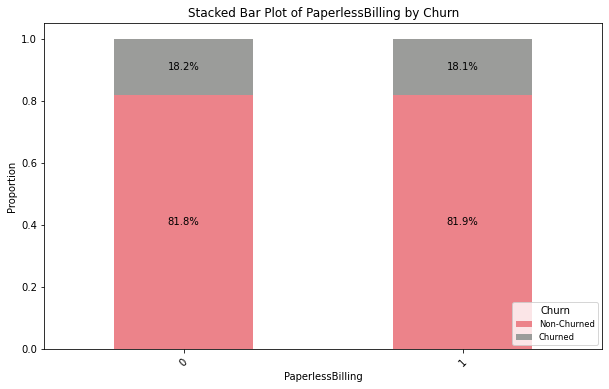

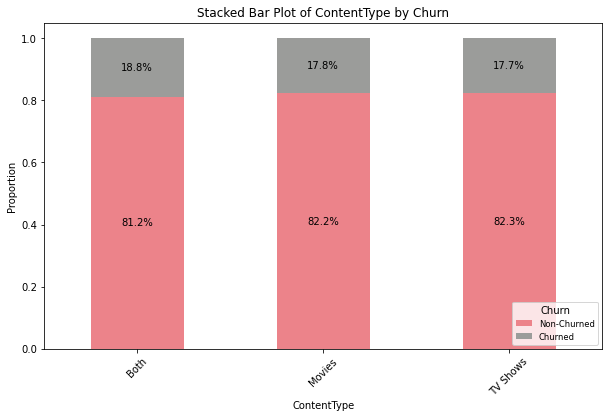

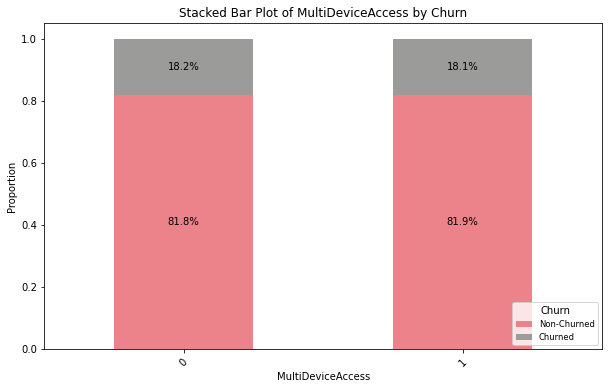

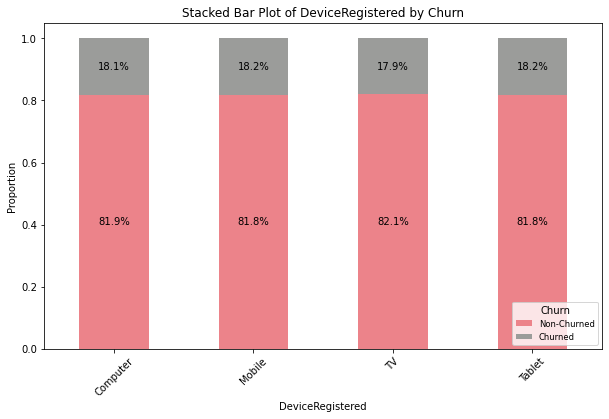

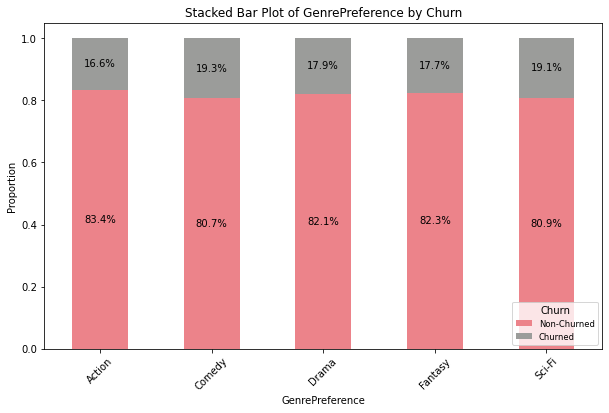

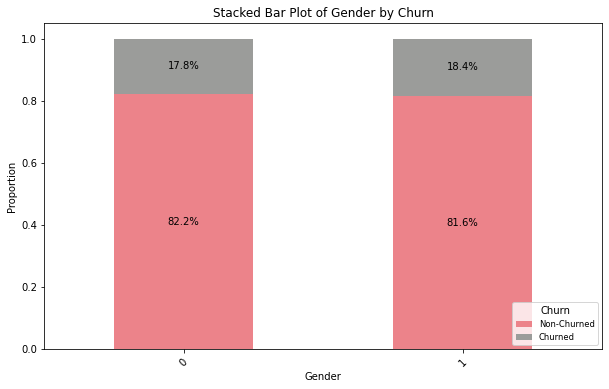

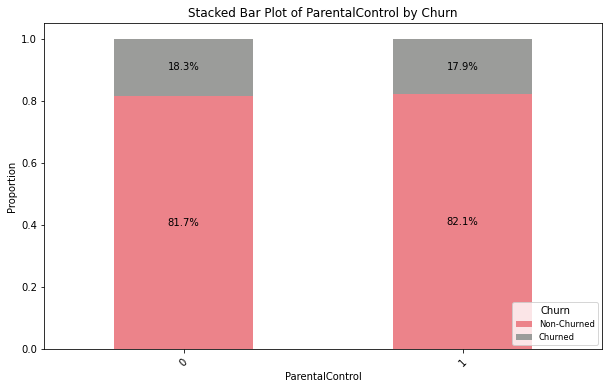

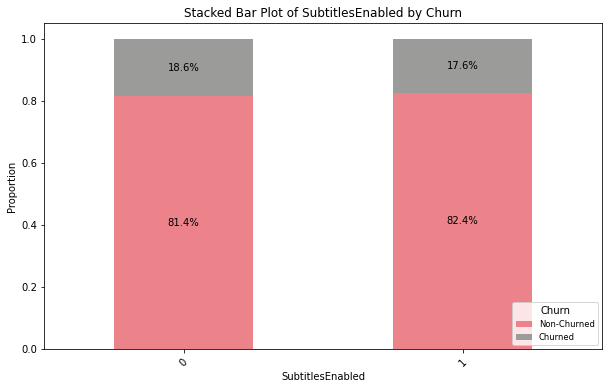

In [22]:
# Function to create stacked bar plot with percentage annotations
def stacked_bar_plot(data, category, target):
    cross_tab = pd.crosstab(data[category], data[target], normalize='index')
    ax = cross_tab.plot(kind='bar', stacked=True, color=['#ec838a', '#9b9c9a'], figsize=(10, 6))
    
    # Annotate bars with percentage values
    for p in ax.patches:
        width, height = p.get_width(), p.get_height()
        x, y = p.get_xy() 
        ax.text(x + width / 2, y + height / 2, f'{height:.1%}', 
                horizontalalignment='center', verticalalignment='center')
    
    plt.title(f'Stacked Bar Plot of {category} by {target}')
    plt.xlabel(category)
    plt.ylabel('Proportion')
    plt.legend(title=target, loc='lower right', labels=['Non-Churned', 'Churned'], fontsize = "small")
    plt.xticks(rotation=45)
    plt.show()

# Create stacked bar plots for each categorical variable
for var in categorical_vars:
    stacked_bar_plot(train_df, var, 'Churn')

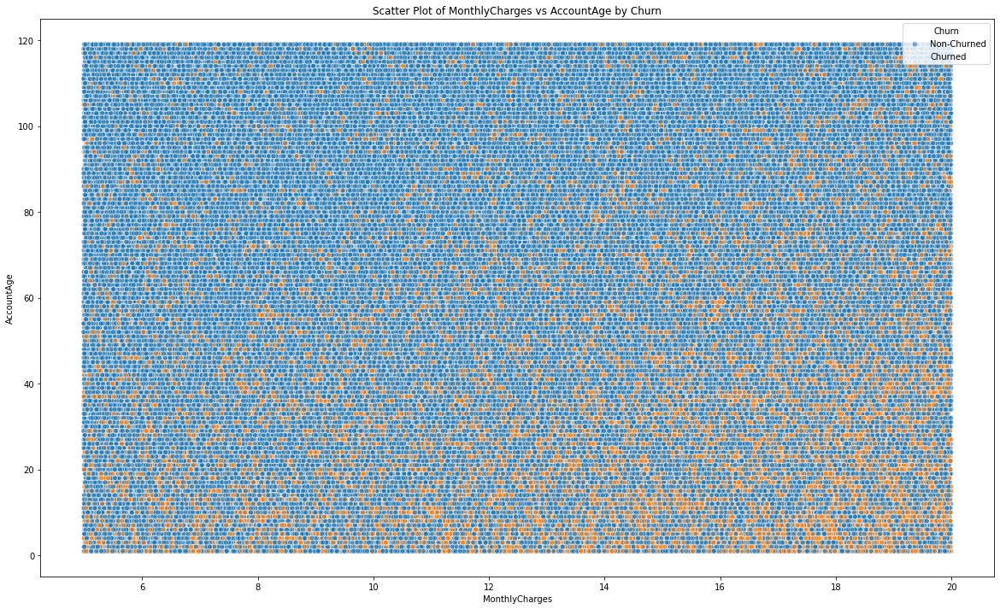

In [23]:
# Example scatter plot between MonthlyCharges and AccountAge
plt.figure(figsize=(20, 12))  # Increase the dimensions of the plot
sns.scatterplot(x='MonthlyCharges', y='AccountAge', hue='Churn', data=train_df, alpha=0.6)
plt.title('Scatter Plot of MonthlyCharges vs AccountAge by Churn')
plt.xlabel('MonthlyCharges')
plt.ylabel('AccountAge')
plt.legend(title='Churn', loc='upper right', labels=['Non-Churned', 'Churned'])
plt.show()

# YORUM EKLE

### İstatistiksel testler

Analyzing AccountAge...


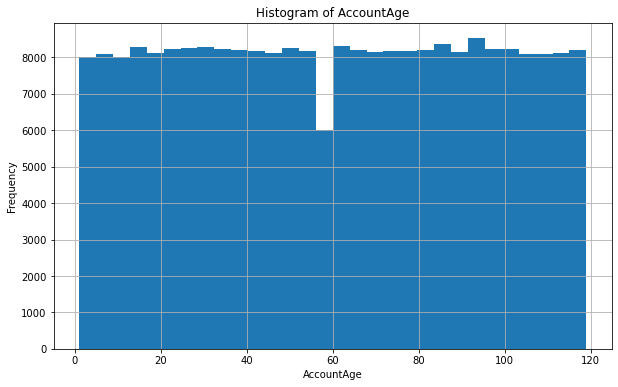

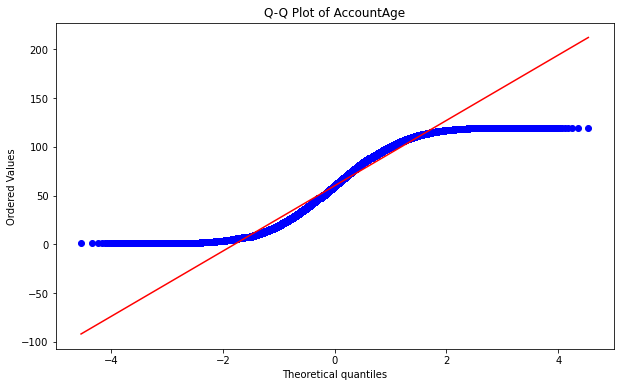

Skewness: -0.0025060289962089925, Kurtosis: -1.1992817199609866
Shapiro-Wilk Test: Statistics=0.955, p=0.000
Sample does not look Gaussian (reject H0)
<-------------------------------------------->
Analyzing MonthlyCharges...


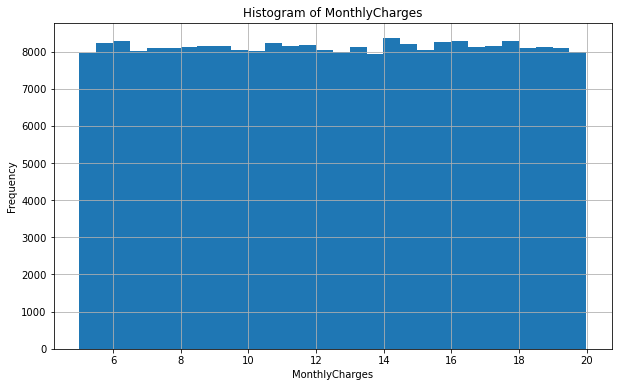

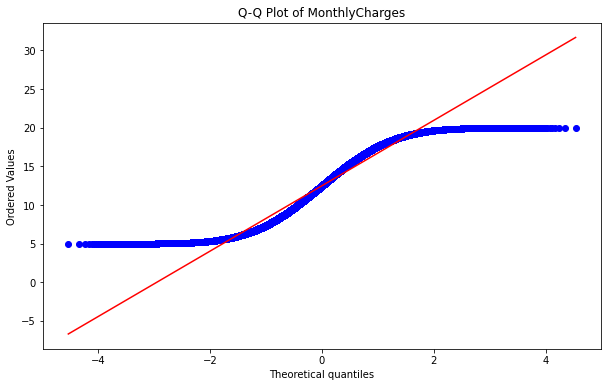

Skewness: -0.003584453626202451, Kurtosis: -1.2015101279183211
Shapiro-Wilk Test: Statistics=0.955, p=0.000
Sample does not look Gaussian (reject H0)
<-------------------------------------------->
Analyzing TotalCharges...


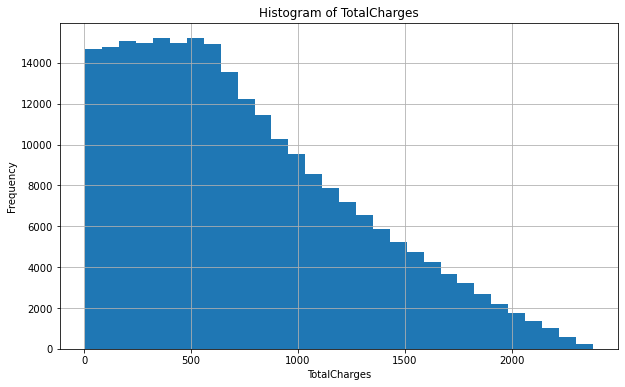

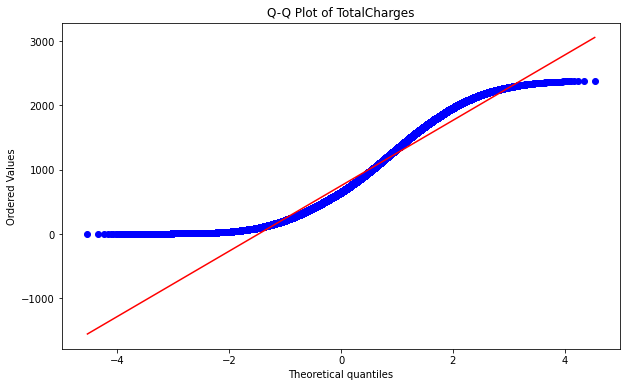

Skewness: 0.6940676574083233, Kurtosis: -0.2620469056454251
Shapiro-Wilk Test: Statistics=0.945, p=0.000
Sample does not look Gaussian (reject H0)
<-------------------------------------------->
Analyzing PaperlessBilling...


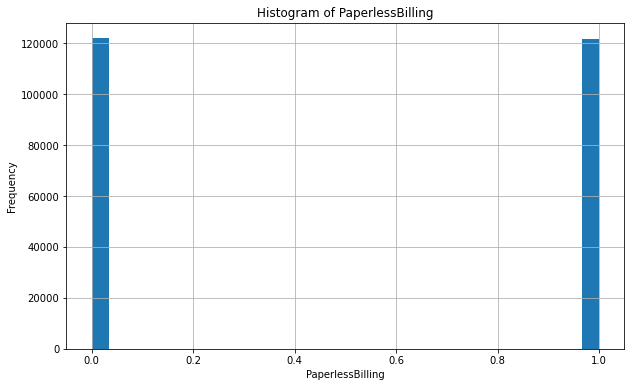

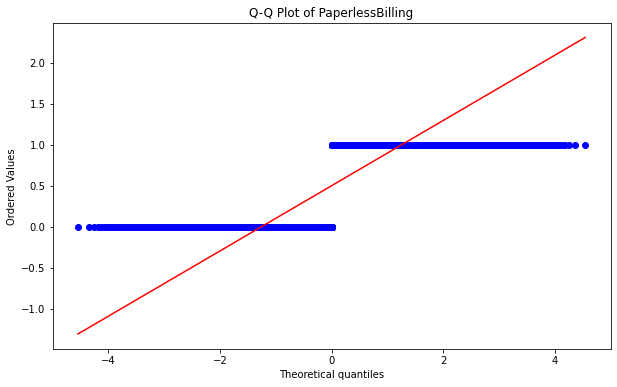

Skewness: 0.0014192808314010237, Kurtosis: -2.000014393593105
Shapiro-Wilk Test: Statistics=0.637, p=0.000
Sample does not look Gaussian (reject H0)
<-------------------------------------------->
Analyzing MultiDeviceAccess...


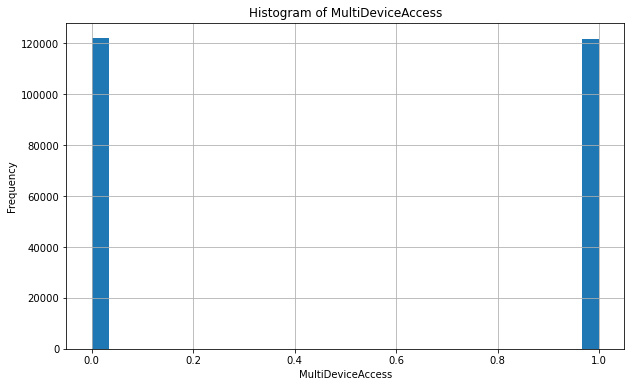

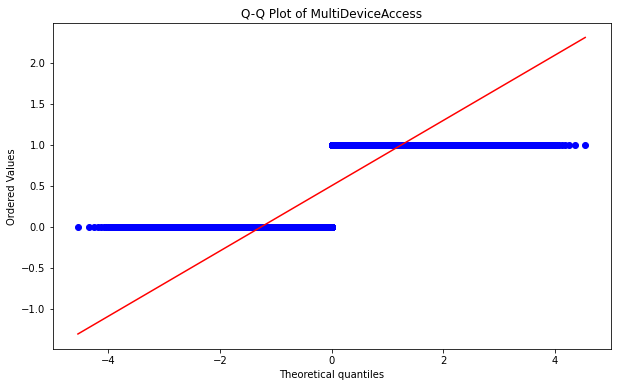

Skewness: 0.0023217147097306023, Kurtosis: -2.000011017564292
Shapiro-Wilk Test: Statistics=0.637, p=0.000
Sample does not look Gaussian (reject H0)
<-------------------------------------------->
Analyzing ViewingHoursPerWeek...


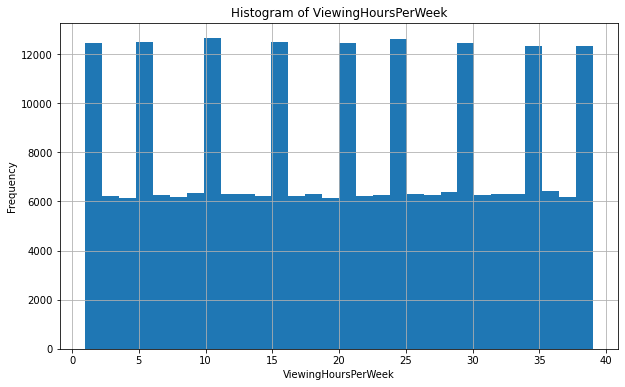

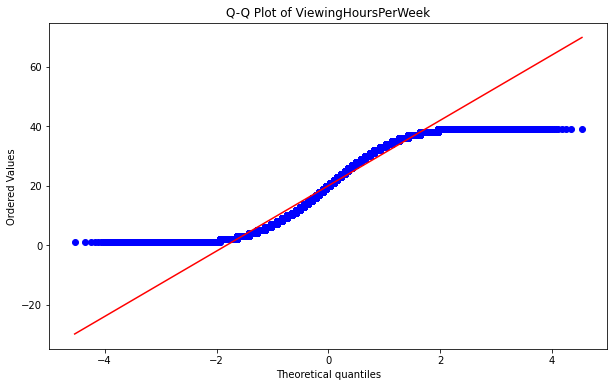

Skewness: -0.0016659677127680878, Kurtosis: -1.2012887341137122
Shapiro-Wilk Test: Statistics=0.953, p=0.000
Sample does not look Gaussian (reject H0)
<-------------------------------------------->
Analyzing AverageViewingDuration...


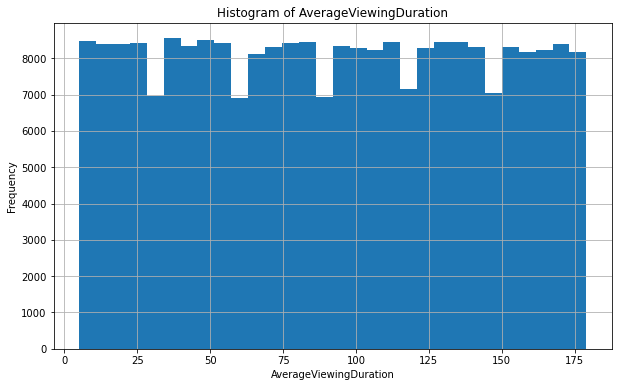

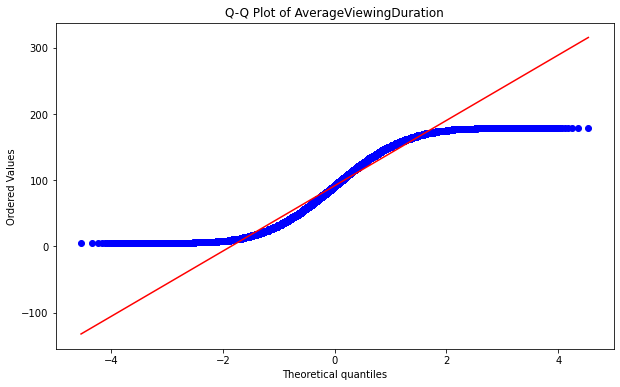

Skewness: 0.002722344906128351, Kurtosis: -1.2009220127388092
Shapiro-Wilk Test: Statistics=0.955, p=0.000
Sample does not look Gaussian (reject H0)
<-------------------------------------------->
Analyzing ContentDownloadsPerMonth...


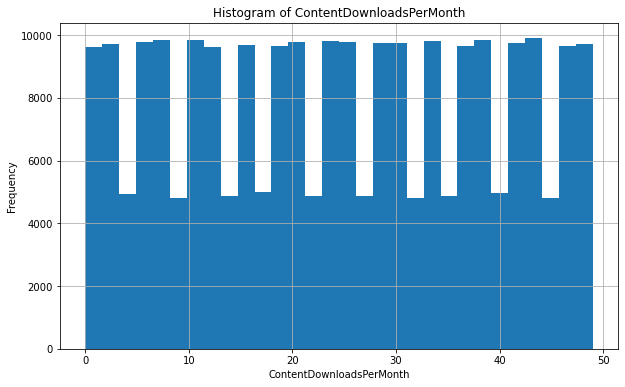

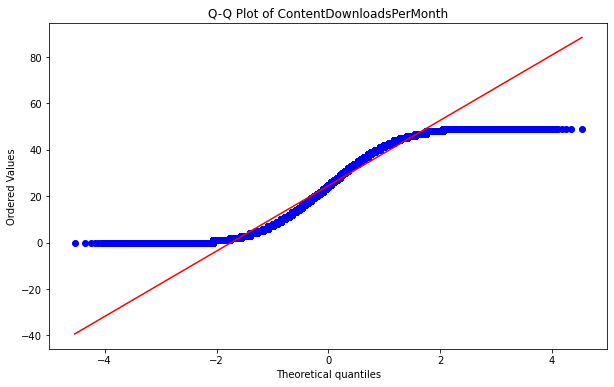

Skewness: -0.00042730885105243804, Kurtosis: -1.201352637425103
Shapiro-Wilk Test: Statistics=0.953, p=0.000
Sample does not look Gaussian (reject H0)
<-------------------------------------------->
Analyzing UserRating...


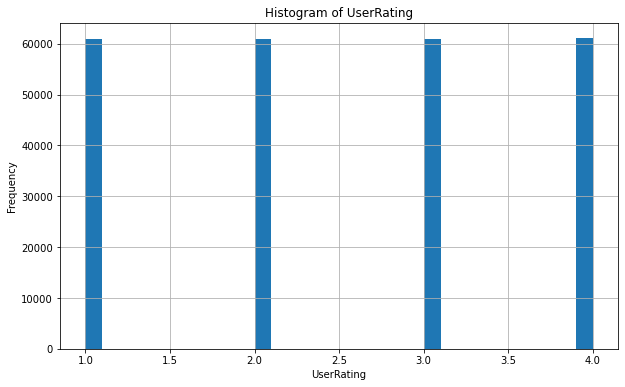

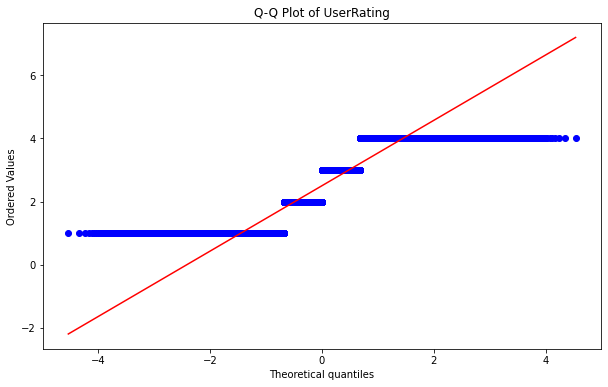

Skewness: -0.0018136995351325858, Kurtosis: -1.3606241100942742
Shapiro-Wilk Test: Statistics=0.858, p=0.000
Sample does not look Gaussian (reject H0)
<-------------------------------------------->
Analyzing SupportTicketsPerMonth...


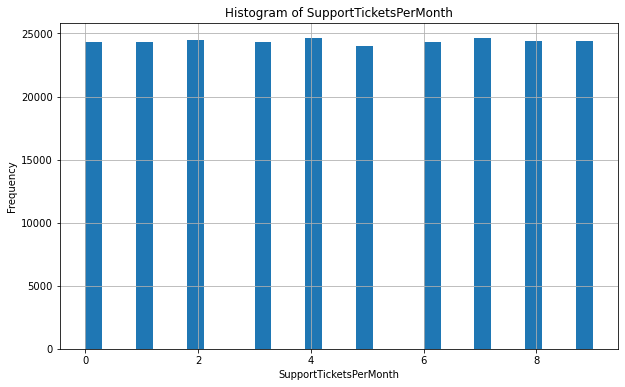

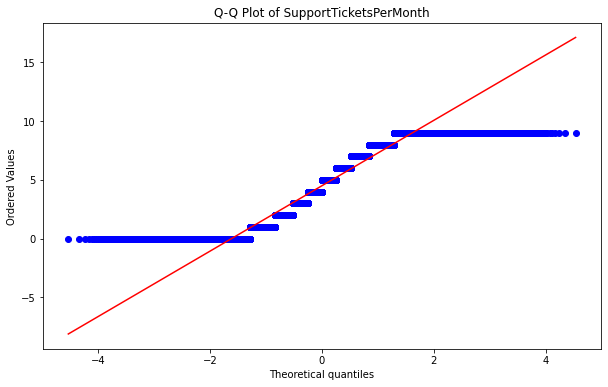

Skewness: -0.0008964185620586845, Kurtosis: -1.225537872167436
Shapiro-Wilk Test: Statistics=0.934, p=0.000
Sample does not look Gaussian (reject H0)
<-------------------------------------------->
Analyzing Gender...


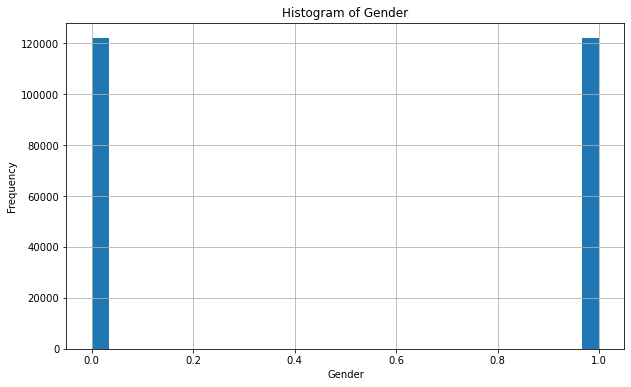

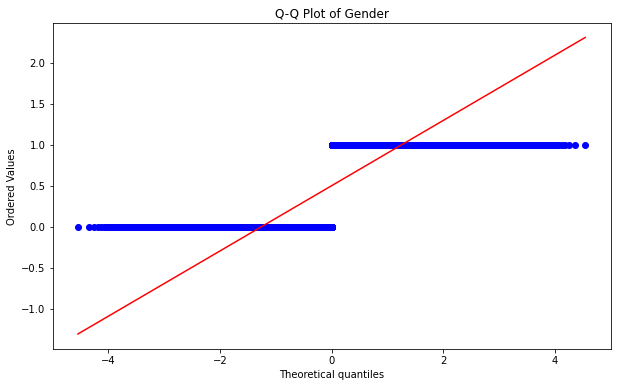

Skewness: 0.0005988871632936488, Kurtosis: -2.0000160492989316
Shapiro-Wilk Test: Statistics=0.637, p=0.000
Sample does not look Gaussian (reject H0)
<-------------------------------------------->
Analyzing WatchlistSize...


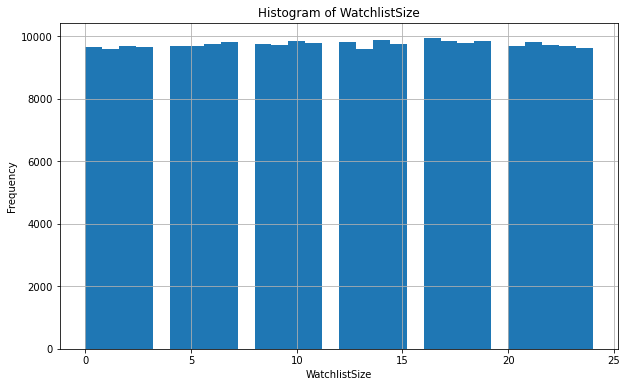

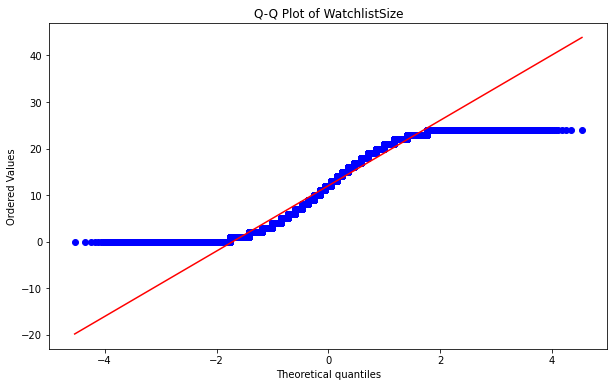

Skewness: -0.00450017176899903, Kurtosis: -1.1995118650915855
Shapiro-Wilk Test: Statistics=0.951, p=0.000
Sample does not look Gaussian (reject H0)
<-------------------------------------------->
Analyzing ParentalControl...


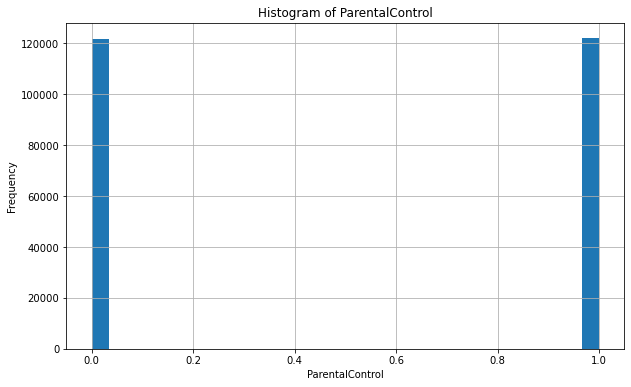

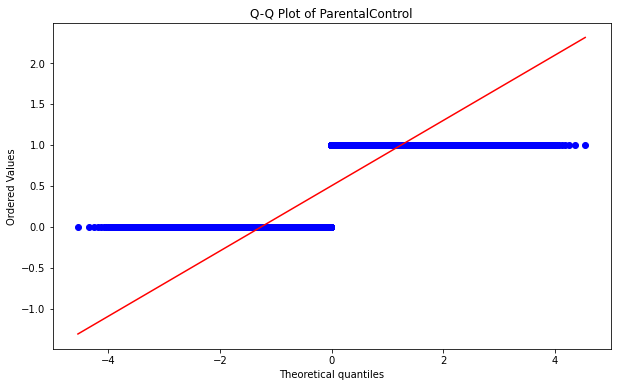

Skewness: -0.0031421103606326744, Kurtosis: -2.0000065350291942
Shapiro-Wilk Test: Statistics=0.636, p=0.000
Sample does not look Gaussian (reject H0)
<-------------------------------------------->
Analyzing SubtitlesEnabled...


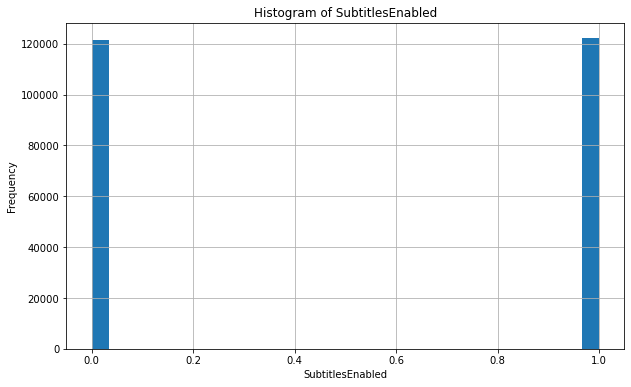

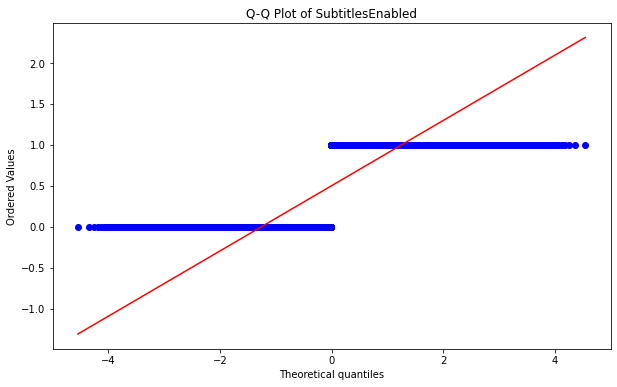

Skewness: -0.00470086680925884, Kurtosis: -1.9999943096376582
Shapiro-Wilk Test: Statistics=0.635, p=0.000
Sample does not look Gaussian (reject H0)
<-------------------------------------------->
Analyzing Churn...


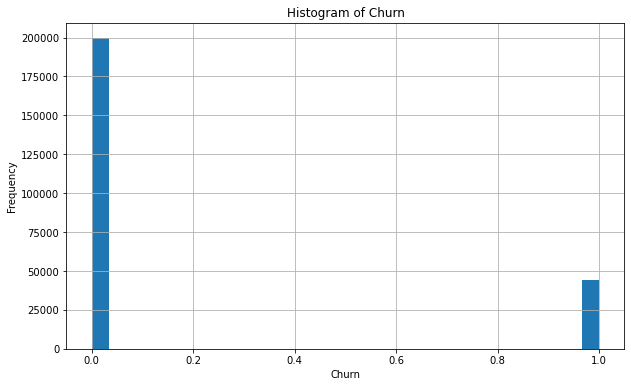

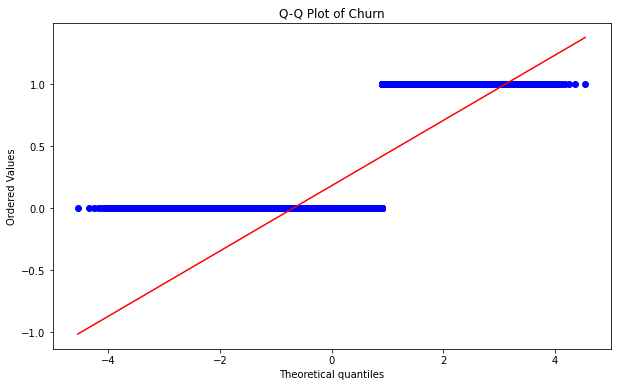

Skewness: 1.6550440835817826, Kurtosis: 0.7391769826531691
Shapiro-Wilk Test: Statistics=0.468, p=0.000
Sample does not look Gaussian (reject H0)
<-------------------------------------------->
{'AccountAge': {'Skewness': -0.0025060289962089925, 'Kurtosis': -1.1992817199609866, 'Shapiro-Wilk Test': {'Statistic': 0.9548647403717041, 'p-value': 0.0}, 'Normality': False}, 'MonthlyCharges': {'Skewness': -0.003584453626202451, 'Kurtosis': -1.2015101279183211, 'Shapiro-Wilk Test': {'Statistic': 0.9548606872558594, 'p-value': 0.0}, 'Normality': False}, 'TotalCharges': {'Skewness': 0.6940676574083233, 'Kurtosis': -0.2620469056454251, 'Shapiro-Wilk Test': {'Statistic': 0.9452660083770752, 'p-value': 0.0}, 'Normality': False}, 'PaperlessBilling': {'Skewness': 0.0014192808314010237, 'Kurtosis': -2.000014393593105, 'Shapiro-Wilk Test': {'Statistic': 0.6367895007133484, 'p-value': 0.0}, 'Normality': False}, 'MultiDeviceAccess': {'Skewness': 0.0023217147097306023, 'Kurtosis': -2.000011017564292, 'Sha

In [30]:
def determine_distributions(df):
    """
    Verilen veri setindeki tüm sayısal sütunların dağılım tipini belirlemek için çeşitli yöntemler kullanır.
    
    Args:
    df (pd.DataFrame): Veri seti
    
    Returns:
    dict: Her sütun için dağılım tipi hakkında bilgiler içeren bir sözlük
    """
    results = {}
    
    # Sayısal sütunları seç
    numeric_columns = df.select_dtypes(include=[np.number]).columns
    
    for column in numeric_columns:
        print(f'Analyzing {column}...')
        column_results = {}
        
        # Histogram
        plt.figure(figsize=(10, 6))
        df[column].hist(bins=30)
        plt.title(f'Histogram of {column}')
        plt.xlabel(column)
        plt.ylabel('Frequency')
        plt.show()
        
        # Q-Q Plot
        plt.figure(figsize=(10, 6))
        stats.probplot(df[column], dist="norm", plot=plt)
        plt.title(f'Q-Q Plot of {column}')
        plt.show()
        
        # Skewness and Kurtosis
        skewness = df[column].skew()
        kurtosis = df[column].kurt()
        column_results['Skewness'] = skewness
        column_results['Kurtosis'] = kurtosis
        print(f'Skewness: {skewness}, Kurtosis: {kurtosis}')
        
        # Shapiro-Wilk Test
        stat, p = shapiro(df[column])
        column_results['Shapiro-Wilk Test'] = {'Statistic': stat, 'p-value': p}
        print('Shapiro-Wilk Test: Statistics=%.3f, p=%.3f' % (stat, p))
        if p > 0.05:
            print('Sample looks Gaussian (fail to reject H0)')
            column_results['Normality'] = True
        else:
            print('Sample does not look Gaussian (reject H0)')
            column_results['Normality'] = False
        
        results[column] = column_results
        print('<-------------------------------------------->')
    
    return results

# Örnek kullanım
distribution_info = determine_distributions(train_df)
print(distribution_info)

#### Analysis of Normality Test Results
Based on the results from the Shapiro-Wilk, Kolmogorov-Smirnov, and Anderson-Darling tests, it is clear that none of the numeric columns in our dataset follow a normal distribution. All tests consistently reject the null hypothesis (H0) that the data is normally distributed.

##### Non-Parametric Methods
Since our data is not normally distributed, we might consider using non-parametric methods that do not assume normality. Some common non-parametric methods include:
- Decision Trees and Ensemble Methods
    - Random Forest
    - Gradient Boosting
    - XGBoost
- Support Vector Machines (SVM):
- K-Nearest Neighbors (KNN):

##### Feature Engineering
We can create new features that might capture the underlying patterns in the data better.

#### Conclusion
Since our data does not follow a normal distribution, we can consider applying transformation techniques, using non-parametric methods, or applying future engineering. These approaches can help improve the performance of our machine learning models by making the data more suitable for analysis.

#### Find positive and negative correlations:

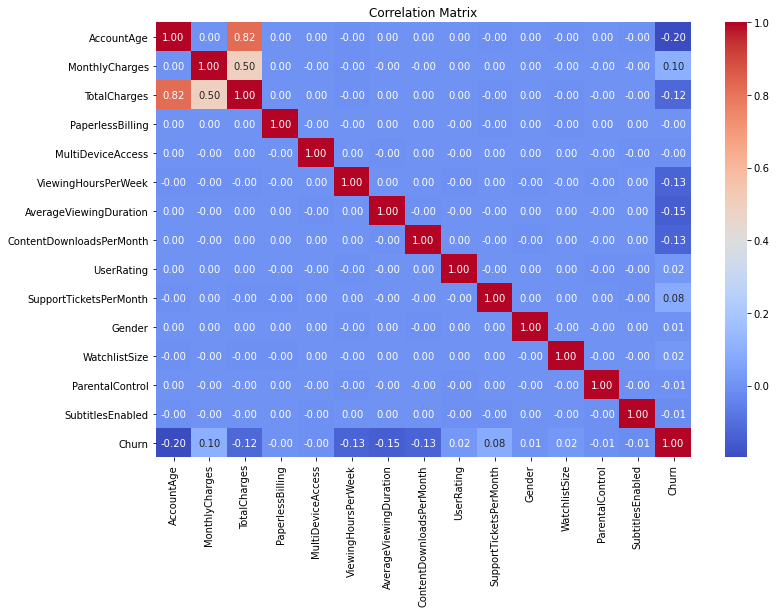

Churn                       1.000000
MonthlyCharges              0.100475
SupportTicketsPerMonth      0.084064
UserRating                  0.022125
WatchlistSize               0.021739
Gender                      0.007467
PaperlessBilling           -0.000923
MultiDeviceAccess          -0.001285
ParentalControl            -0.005531
SubtitlesEnabled           -0.012372
TotalCharges               -0.120529
ViewingHoursPerWeek        -0.128628
ContentDownloadsPerMonth   -0.129752
AverageViewingDuration     -0.146880
AccountAge                 -0.197736
Name: Churn, dtype: float64


In [32]:
# Calculate correlation matrix
corr_matrix = train_df.corr()

# Plot heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

# Correlation with target variable
corr_with_target = corr_matrix['Churn'].sort_values(ascending=False)
print(corr_with_target)

**Most Positive Correlations:**
- MonthlyCharges : There is a weak positive correlation between monthly charges and churn. Customers with higher monthly charges are slightly more likely to churn.
- SupportTicketsPerMonth : There is a weak positive correlation between the number of support tickets per month and churn. Customers who open more support tickets are slightly more likely to churn.

**Most Negative Correlations:**
- AccountAge : There is a moderate negative correlation between account age and churn. Customers with older accounts are less likely to churn.
- AverageViewingDuration : There is a weak negative correlation between average viewing duration and churn. Customers who spend more time viewing content are less likely to churn.
- ContentDownloadsPerMonth : There is a weak negative correlation between the number of content downloads per month and churn.
- ViewingHoursPerWeek : There is a weak negative correlation between viewing hours per week and churn.
- TotalCharges : There is a weak negative correlation between total charges and churn.

In [33]:
train_df = train_df.drop(['TotalCharges'], axis=1)
test_df = test_df.drop(['TotalCharges'], axis=1)

In [34]:
numeric_vars_train = numeric_vars_train.drop(['TotalCharges'], axis=1)
numeric_vars_test = numeric_vars_test.drop(['TotalCharges'], axis=1)

#### Identifying and Handling Outliers

Outliers can be identified using various methods such as the Z-score or the IQR (Interquartile Range) method. Here, we'll use the IQR method:

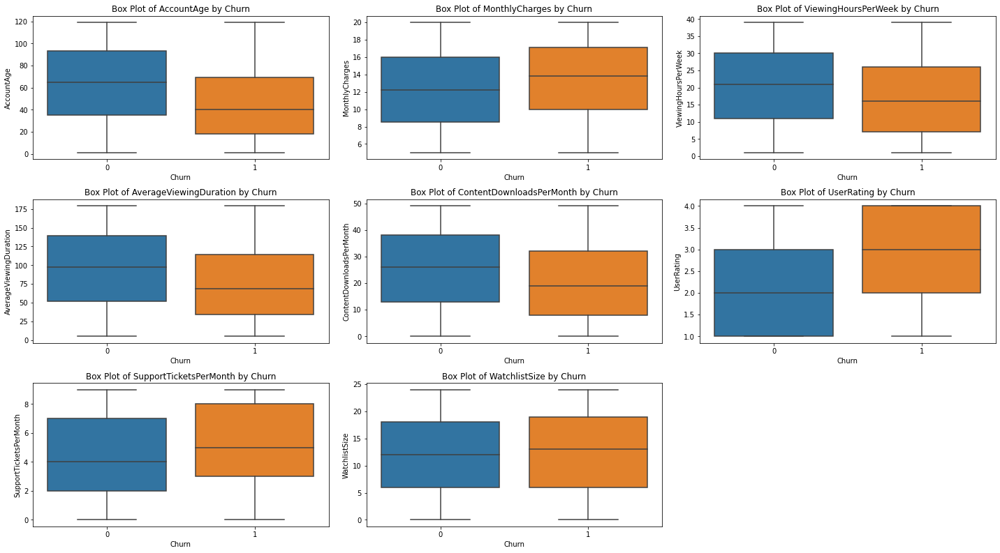

In [35]:
# Create box plots for each numeric variable
plt.figure(figsize=(20, 18))
for i, var in enumerate(numeric_vars_train, 1):
    plt.subplot(5, 3, i)
    sns.boxplot(x='Churn', y=var, data=train_df)
    plt.title(f'Box Plot of {var} by Churn')
plt.tight_layout()
plt.show()

In [36]:
# Handling outliers (example: capping)
def cap_outliers(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    df[column] = np.where(df[column] < lower_bound, lower_bound, df[column])
    df[column] = np.where(df[column] > upper_bound, upper_bound, df[column])

In [37]:
# Apply capping to handle outliers for train dataset
for col in numeric_vars_train:
    cap_outliers(train_df, col)
    
# Apply capping to handle outliers for test dataset
for col in numeric_vars_test:
    cap_outliers(test_df, col)

#### Encoding

In [38]:
# Assuming train_df is already defined
categorical_vars = ['SubscriptionType', 'PaymentMethod', 'ContentType', 'DeviceRegistered', 'GenrePreference']

# Initialize the OneHotEncoder
encoder = OneHotEncoder(sparse=False)  # drop='first' to avoid multicollinearity

# Fit and transform the categorical variables
train_encoded_vars = encoder.fit_transform(train_df[categorical_vars])
test_encoded_vars = encoder.fit_transform(test_df[categorical_vars])

# Create a DataFrame with the encoded variables
train_df_encoded = pd.DataFrame(train_encoded_vars, columns=encoder.get_feature_names(categorical_vars))
test_df_encoded = pd.DataFrame(test_encoded_vars, columns=encoder.get_feature_names(categorical_vars))

# Concatenate the encoded variables back to the original DataFrame
train_df = pd.concat([train_df.drop(columns=categorical_vars), train_df_encoded], axis=1)
# Concatenate the encoded variables back to the original DataFrame
test_df = pd.concat([test_df.drop(columns=categorical_vars), test_df_encoded], axis=1)

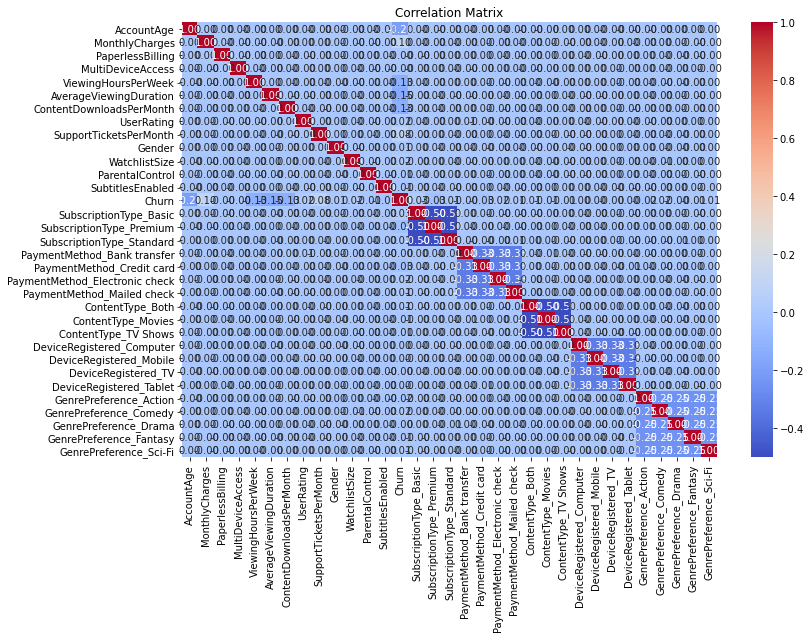

Churn                             1.000000
MonthlyCharges                    0.100475
SupportTicketsPerMonth            0.084064
SubscriptionType_Basic            0.028010
UserRating                        0.022125
WatchlistSize                     0.021739
PaymentMethod_Electronic check    0.016913
GenrePreference_Comedy            0.015876
PaymentMethod_Mailed check        0.014441
ContentType_Both                  0.013345
GenrePreference_Sci-Fi            0.013183
Gender                            0.007467
SubscriptionType_Standard         0.005692
DeviceRegistered_Mobile           0.001708
DeviceRegistered_Tablet           0.001374
DeviceRegistered_Computer         0.000177
PaperlessBilling                 -0.000923
MultiDeviceAccess                -0.001285
PaymentMethod_Bank transfer      -0.002938
DeviceRegistered_TV              -0.003267
GenrePreference_Drama            -0.003274
ParentalControl                  -0.005531
GenrePreference_Fantasy          -0.005853
ContentType

In [39]:
# Calculate correlation matrix
corr_matrix = train_df.corr()

# Plot heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

# Correlation with target variable
corr_with_target = corr_matrix['Churn'].sort_values(ascending=False)
print(corr_with_target)

#### Observations
1. Positive Correlations:
    - MonthlyCharges (0.100475) and SupportTicketsPerMonth (0.084064) have the highest positive correlations with Churn. This suggests that higher monthly charges and more support tickets are associated with a higher likelihood of churn. 
    - SubscriptionType_Basic (0.028010) and UserRating (0.022125) also show a positive correlation, though weaker.
2. Negative Correlations:
    - AccountAge (-0.197736) has the strongest negative correlation with Churn, indicating that longer account age is associated with a lower likelihood of churn.
    - AverageViewingDuration (-0.146880) and ContentDownloadsPerMonth (-0.129752) also show significant negative correlations, suggesting that more engaged users (those who watch for longer durations and download more content) are less likely to churn.
    - ViewingHoursPerWeek (-0.128628) follows a similar pattern.
3. Weak Correlations:
    - Many features, such as DeviceRegistered and GenrePreference, show very weak correlations with Churn, indicating that these features might not be strong predictors of churn.

#### Conclusion
1. Key Predictors:
    - Features like MonthlyCharges, SupportTicketsPerMonth, AccountAge, AverageViewingDuration, and ContentDownloadsPerMonth are more likely to be important predictors of churn. These should be given more attention in predictive modeling and customer retention strategies.
2. Customer Engagement:
    - Higher engagement metrics (e.g., AverageViewingDuration, ContentDownloadsPerMonth, ViewingHoursPerWeek) are associated with lower churn. This suggests that increasing user engagement could be an effective strategy to reduce churn.
3. Subscription and Payment Methods:
    - The type of subscription and payment method have relatively weak correlations with churn. However, SubscriptionType_Basic shows a slight positive correlation, indicating that users with basic subscriptions might be more prone to churn compared to those with premium subscriptions.

In [40]:
train_df['AccountAge'] = train_df['AccountAge'].astype(int)
train_df['MonthlyCharges'] = train_df['MonthlyCharges'].round(2)
train_df['ViewingHoursPerWeek'] = train_df['ViewingHoursPerWeek'].astype(int)
train_df['AverageViewingDuration'] = train_df['AverageViewingDuration'].astype(int)
train_df['ContentDownloadsPerMonth'] = train_df['ContentDownloadsPerMonth'].astype(int)
train_df['UserRating'] = train_df['UserRating'].astype(int)
train_df['SupportTicketsPerMonth'] = train_df['SupportTicketsPerMonth'].astype(int)
train_df['WatchlistSize'] = train_df['WatchlistSize'].astype(int)
train_df['SubscriptionType_Basic'] = train_df['SubscriptionType_Basic'].astype(int)
train_df['SubscriptionType_Premium'] = train_df['SubscriptionType_Premium'].astype(int)
train_df['SubscriptionType_Standard'] = train_df['SubscriptionType_Standard'].astype(int)
train_df['PaymentMethod_Bank transfer'] = train_df['PaymentMethod_Bank transfer'].astype(int)
train_df['PaymentMethod_Credit card'] = train_df['PaymentMethod_Credit card'].astype(int)
train_df['PaymentMethod_Electronic check'] = train_df['PaymentMethod_Electronic check'].astype(int)
train_df['PaymentMethod_Mailed check'] = train_df['PaymentMethod_Mailed check'].astype(int)
train_df['ContentType_Both'] = train_df['ContentType_Both'].astype(int)
train_df['ContentType_Movies'] = train_df['ContentType_Movies'].astype(int)
train_df['ContentType_TV Shows'] = train_df['ContentType_TV Shows'].astype(int)
train_df['DeviceRegistered_Computer'] = train_df['DeviceRegistered_Computer'].astype(int)
train_df['DeviceRegistered_Mobile'] = train_df['DeviceRegistered_Mobile'].astype(int)
train_df['DeviceRegistered_TV'] = train_df['DeviceRegistered_TV'].astype(int)
train_df['DeviceRegistered_Tablet'] = train_df['DeviceRegistered_Tablet'].astype(int)
train_df['GenrePreference_Action'] = train_df['GenrePreference_Action'].astype(int)
train_df['GenrePreference_Comedy'] = train_df['GenrePreference_Comedy'].astype(int)
train_df['GenrePreference_Drama'] = train_df['GenrePreference_Drama'].astype(int)
train_df['GenrePreference_Fantasy'] = train_df['GenrePreference_Fantasy'].astype(int)
train_df['GenrePreference_Sci-Fi'] = train_df['GenrePreference_Sci-Fi'].astype(int)

In [41]:
test_df['AccountAge'] = test_df['AccountAge'].astype(int)
test_df['MonthlyCharges'] = test_df['MonthlyCharges'].round(2)
test_df['ViewingHoursPerWeek'] = test_df['ViewingHoursPerWeek'].astype(int)
test_df['AverageViewingDuration'] = test_df['AverageViewingDuration'].astype(int)
test_df['ContentDownloadsPerMonth'] = test_df['ContentDownloadsPerMonth'].astype(int)
test_df['UserRating'] = test_df['UserRating'].astype(int)
test_df['SupportTicketsPerMonth'] = test_df['SupportTicketsPerMonth'].astype(int)
test_df['WatchlistSize'] = test_df['WatchlistSize'].astype(int)
test_df['SubscriptionType_Basic'] = test_df['SubscriptionType_Basic'].astype(int)
test_df['SubscriptionType_Premium'] = test_df['SubscriptionType_Premium'].astype(int)
test_df['SubscriptionType_Standard'] = test_df['SubscriptionType_Standard'].astype(int)
test_df['PaymentMethod_Bank transfer'] = test_df['PaymentMethod_Bank transfer'].astype(int)
test_df['PaymentMethod_Credit card'] = test_df['PaymentMethod_Credit card'].astype(int)
test_df['PaymentMethod_Electronic check'] = test_df['PaymentMethod_Electronic check'].astype(int)
test_df['PaymentMethod_Mailed check'] = test_df['PaymentMethod_Mailed check'].astype(int)
test_df['ContentType_Both'] = test_df['ContentType_Both'].astype(int)
test_df['ContentType_Movies'] = test_df['ContentType_Movies'].astype(int)
test_df['ContentType_TV Shows'] = test_df['ContentType_TV Shows'].astype(int)
test_df['DeviceRegistered_Computer'] = test_df['DeviceRegistered_Computer'].astype(int)
test_df['DeviceRegistered_Mobile'] = test_df['DeviceRegistered_Mobile'].astype(int)
test_df['DeviceRegistered_TV'] = test_df['DeviceRegistered_TV'].astype(int)
test_df['DeviceRegistered_Tablet'] = test_df['DeviceRegistered_Tablet'].astype(int)
test_df['GenrePreference_Action'] = test_df['GenrePreference_Action'].astype(int)
test_df['GenrePreference_Comedy'] = test_df['GenrePreference_Comedy'].astype(int)
test_df['GenrePreference_Drama'] = test_df['GenrePreference_Drama'].astype(int)
test_df['GenrePreference_Fantasy'] = test_df['GenrePreference_Fantasy'].astype(int)
test_df['GenrePreference_Sci-Fi'] = test_df['GenrePreference_Sci-Fi'].astype(int)

## Feature Engineering

### Feature Importance

Use models like Gradient Boosting to determine feature importance. This models can provide insights into which features are most influential in predicting churn.

**Splitting dependent and independent variables**

In [42]:
X = train_df.drop(['Churn', 'CustomerID'], axis=1)
y = train_df['Churn']
test_df_X = test_df.drop(['CustomerID'], axis=1)

#### Gradient Boosting

In [43]:
# Train model
gb_model = GradientBoostingClassifier(random_state=42)
gb_model.fit(X, y)

GradientBoostingClassifier(random_state=42)

In [44]:
# Get feature importances
gb_importances = gb_model.feature_importances_

#### Combine feature importances

In [45]:
combined_importances = gb_importances
indices = np.argsort(combined_importances)[::-1]

# Print combined feature ranking
print("Combined Feature ranking:")
for f in range(X.shape[1]):
    print(f"{f + 1}. feature {X.columns[indices[f]]} ({combined_importances[indices[f]]})")

Combined Feature ranking:
1. feature AccountAge (0.3338956358773487)
2. feature AverageViewingDuration (0.1877719036399662)
3. feature ContentDownloadsPerMonth (0.14973772805343008)
4. feature ViewingHoursPerWeek (0.14758956021111053)
5. feature MonthlyCharges (0.09184181904489316)
6. feature SupportTicketsPerMonth (0.059576329135334144)
7. feature SubscriptionType_Premium (0.00752111556580666)
8. feature PaymentMethod_Credit card (0.005742509426564755)
9. feature WatchlistSize (0.0038334956699209973)
10. feature UserRating (0.0033174332021003432)
11. feature SubscriptionType_Basic (0.003060862499223854)
12. feature GenrePreference_Action (0.002106869969227396)
13. feature ContentType_Both (0.0008895307477322131)
14. feature GenrePreference_Sci-Fi (0.0008410314052440743)
15. feature GenrePreference_Comedy (0.000763243234786465)
16. feature PaymentMethod_Electronic check (0.0005873480938942005)
17. feature PaymentMethod_Mailed check (0.0004503748359172173)
18. feature SubtitlesEnabled (

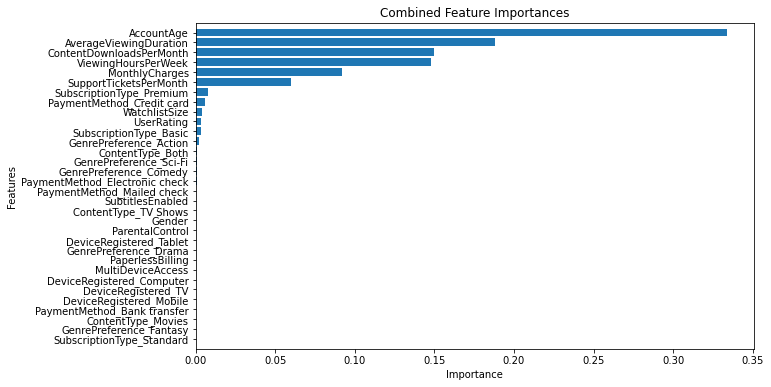

In [46]:
plt.figure(figsize=(10, 6))
plt.title("Combined Feature Importances")
plt.barh(range(X.shape[1]), combined_importances[indices], align="center")
plt.yticks(range(X.shape[1]), X.columns[indices])
plt.ylim([-1, X.shape[1]])
plt.xlabel('Importance')
plt.ylabel('Features')
plt.gca().invert_yaxis()  # En önemli özelliğin en üstte olması için
plt.show()

### Feature Extraction

In [47]:
# Interaction Features
X['MonthlyCharges_per_ViewingHour'] = X['MonthlyCharges'] / X['ViewingHoursPerWeek']
X['AverageViewingDuration_per_ViewingHour'] = X['AverageViewingDuration'] / X['ViewingHoursPerWeek']

# Temporal Features
X['AccountAge_in_Years'] = X['AccountAge'] / 12

# Behavioral Features
X['EngagementScore'] = (X['ViewingHoursPerWeek'] * X['AverageViewingDuration'] * X['ContentDownloadsPerMonth'] / 4)
X['SupportInteraction'] = X['SupportTicketsPerMonth'] * X['UserRating']


# Interaction Features
test_df_X['MonthlyCharges_per_ViewingHour'] = test_df_X['MonthlyCharges'] / test_df_X['ViewingHoursPerWeek']
test_df_X['AverageViewingDuration_per_ViewingHour'] = test_df_X['AverageViewingDuration'] / test_df_X['ViewingHoursPerWeek']

# Temporal Features
test_df_X['AccountAge_in_Years'] = test_df_X['AccountAge'] / 12

# Behavioral Features
test_df_X['EngagementScore'] = (test_df_X['ViewingHoursPerWeek'] * test_df_X['AverageViewingDuration'] * test_df_X['ContentDownloadsPerMonth'] / 4 + test_df_X['WatchlistSize'].pow(2))
test_df_X['SupportInteraction'] = test_df_X['SupportTicketsPerMonth'] * test_df_X['UserRating']

In [48]:
columns_to_drop = ['MonthlyCharges', 'ViewingHoursPerWeek', 'AverageViewingDuration', 'AccountAge', 
                   'ContentDownloadsPerMonth', 'SupportTicketsPerMonth', 'UserRating', 'WatchlistSize']
train_df = train_df.drop(columns=columns_to_drop, axis=1)
test_df = test_df.drop(columns=columns_to_drop, axis=1)

In [49]:
X = X.drop(columns=columns_to_drop, axis=1)
test_df_X = test_df_X.drop(columns=columns_to_drop, axis=1)

In [50]:
X['MonthlyCharges_per_ViewingHour'] = X['MonthlyCharges_per_ViewingHour'].round(2)
X['AverageViewingDuration_per_ViewingHour'] = X['AverageViewingDuration_per_ViewingHour'].round(2)
X['AccountAge_in_Years'] = X['AccountAge_in_Years'].round(2)
X['EngagementScore'] = X['EngagementScore'].round(2)
X['SupportInteraction'] = X['SupportInteraction'].astype(int)
test_df_X['MonthlyCharges_per_ViewingHour'] = test_df_X['MonthlyCharges_per_ViewingHour'].round(2)
test_df_X['AverageViewingDuration_per_ViewingHour'] = test_df_X['AverageViewingDuration_per_ViewingHour'].round(2)
test_df_X['AccountAge_in_Years'] = test_df_X['AccountAge_in_Years'].round(2)
test_df_X['EngagementScore'] = test_df_X['EngagementScore'].round(2)
test_df_X['SupportInteraction'] = test_df_X['SupportInteraction'].astype(int)

In [51]:
featured_vars = ['MonthlyCharges_per_ViewingHour', 'AverageViewingDuration_per_ViewingHour', 'AccountAge_in_Years',
                 'EngagementScore', 'SupportInteraction']

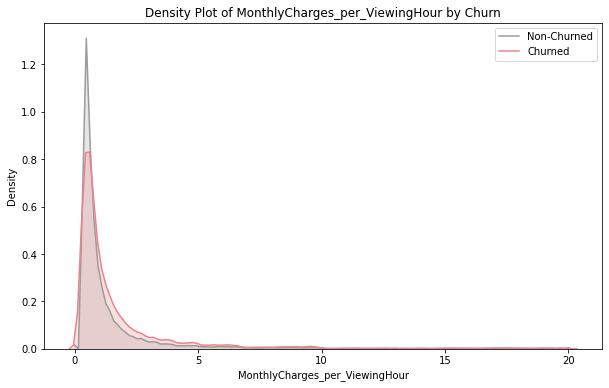

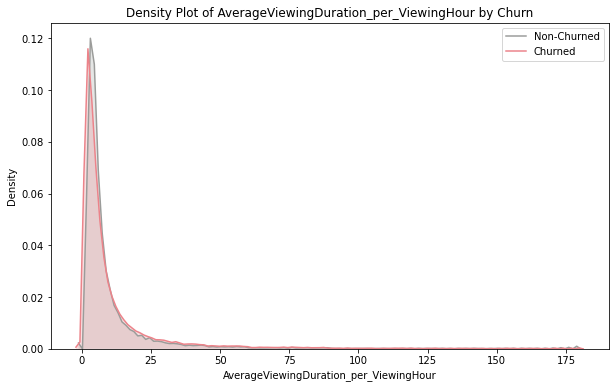

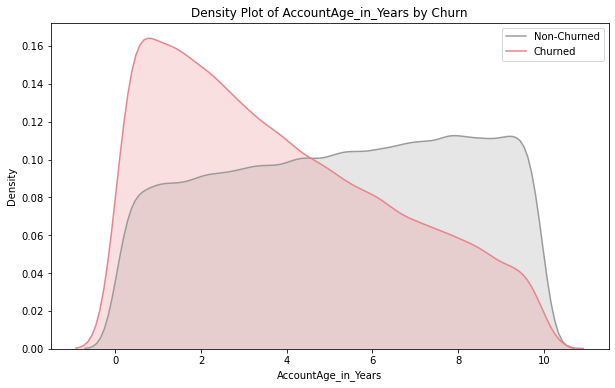

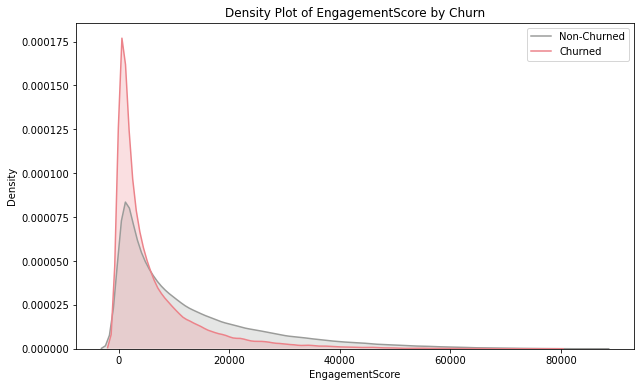

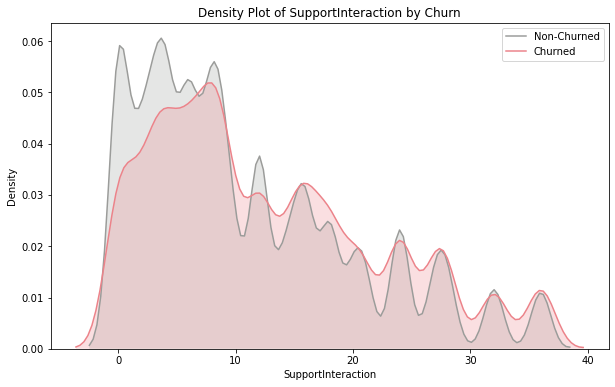

In [52]:
# Ensure the target variable is numeric
X['Churn'] = y.astype(int)

# Function to create density plot for continuous variables
def density_plot(data, continuous_var, target):
    plt.figure(figsize=(10, 6))
    sns.kdeplot(data[data[target] == 0][continuous_var], label='Non-Churned', shade=True, color='#9b9c9a')
    sns.kdeplot(data[data[target] == 1][continuous_var], label='Churned', shade=True, color='#ec838a')
    plt.title(f'Density Plot of {continuous_var} by {target}')
    plt.xlabel(continuous_var)
    plt.ylabel('Density')
    plt.legend()
    plt.show()
    
# Create density plots for featured variables
for var in featured_vars:
    density_plot(X, var, 'Churn')

#### handle outliers

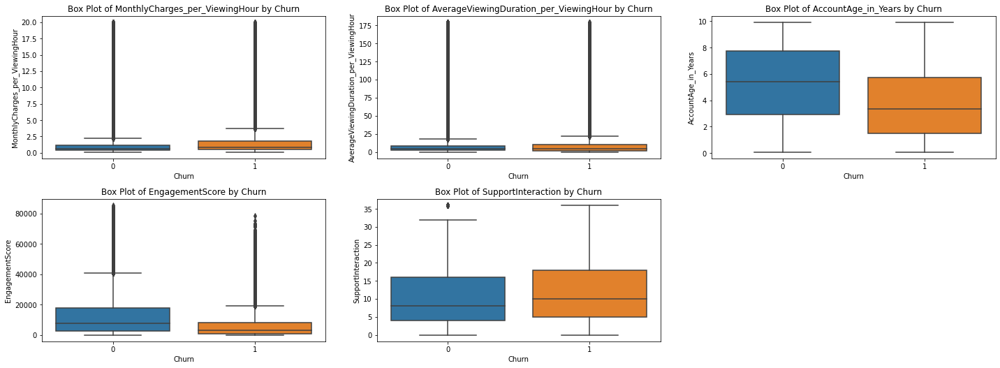

In [53]:
# Create box plots for each numeric featured variable
plt.figure(figsize=(20, 18))
for i, var in enumerate(featured_vars, 1):
    plt.subplot(5, 3, i)
    sns.boxplot(x='Churn', y=var, data=X)
    plt.title(f'Box Plot of {var} by Churn')
plt.tight_layout()
plt.show()

In [54]:
# Apply capping to handle outliers
for col in featured_vars:
    cap_outliers(X, col)
    
# Apply capping to handle outliers
for col in featured_vars:
    cap_outliers(test_df_X, col)

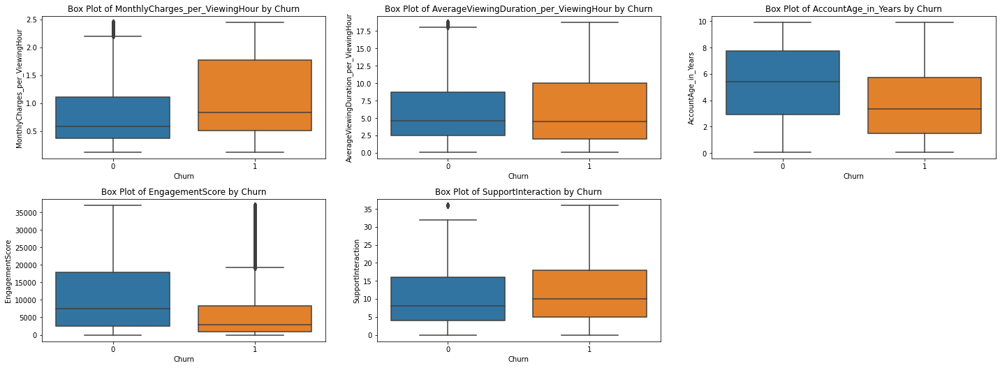

In [55]:
# Create box plots for each numeric variable
plt.figure(figsize=(20, 18))
for i, var in enumerate(featured_vars, 1):
    plt.subplot(5, 3, i)
    sns.boxplot(x='Churn', y=var, data=X)
    plt.title(f'Box Plot of {var} by Churn')
plt.tight_layout()
plt.show()

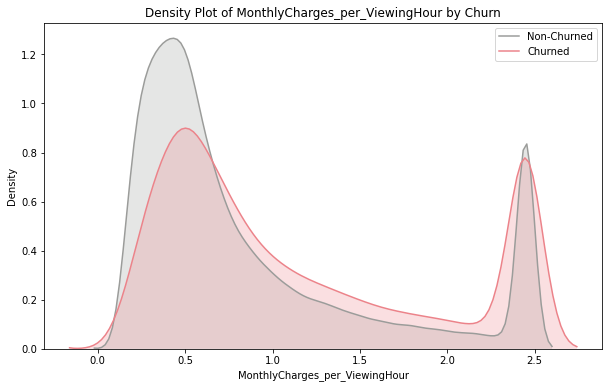

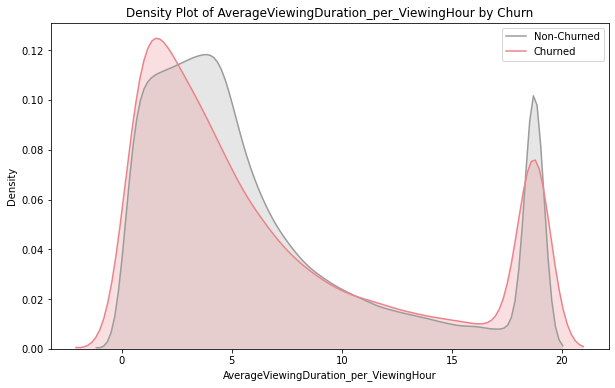

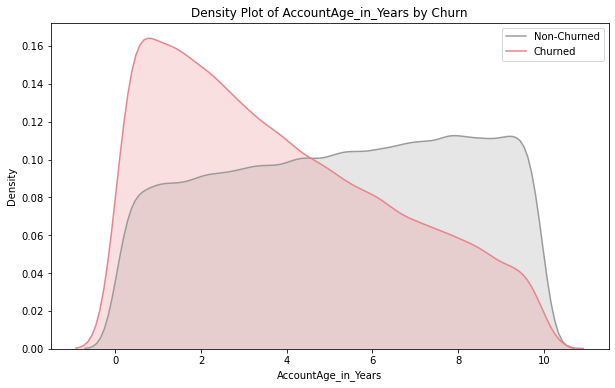

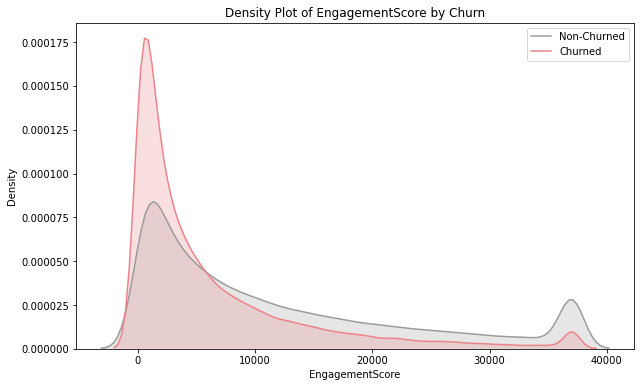

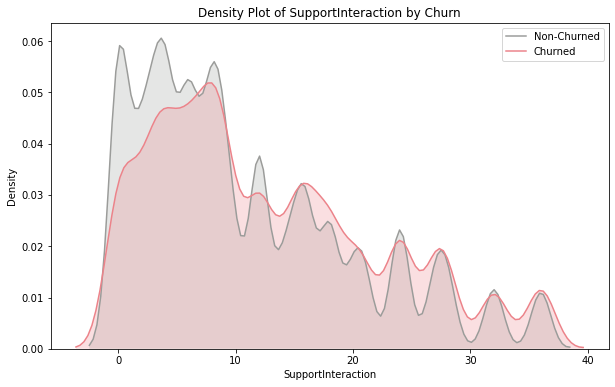

In [56]:
# Function to create density plot for continuous variables
def density_plot(data, continuous_var, target):
    plt.figure(figsize=(10, 6))
    sns.kdeplot(data[data[target] == 0][continuous_var], label='Non-Churned', shade=True, color='#9b9c9a')
    sns.kdeplot(data[data[target] == 1][continuous_var], label='Churned', shade=True, color='#ec838a')
    plt.title(f'Density Plot of {continuous_var} by {target}')
    plt.xlabel(continuous_var)
    plt.ylabel('Density')
    plt.legend()
    plt.show()
    
# Create density plots for featured variables
for var in featured_vars:
    density_plot(X, var, 'Churn')

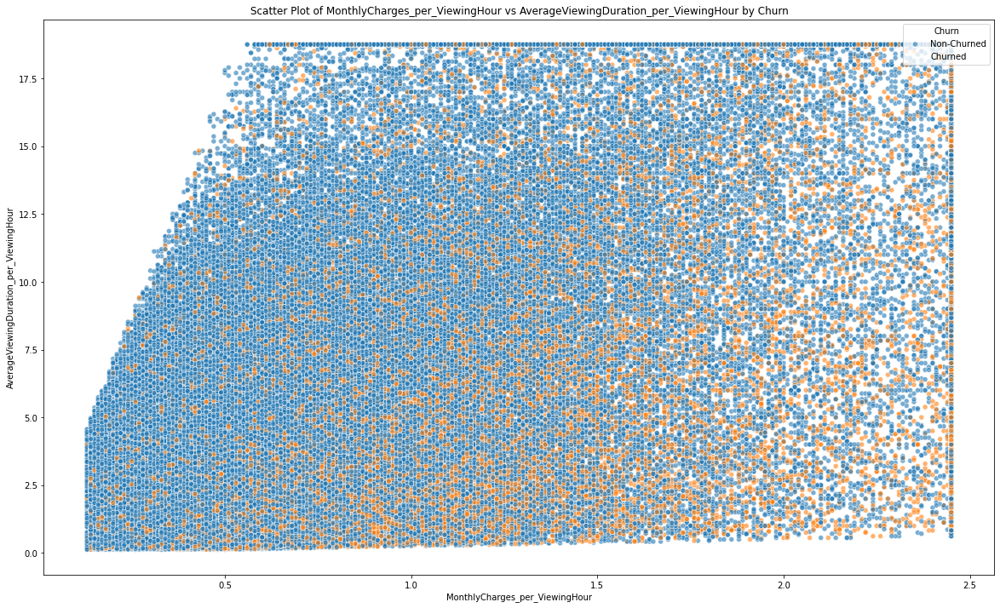

In [57]:
# Example scatter plot between MonthlyCharges_per_ViewingHour and AccountAge_in_Years
plt.figure(figsize=(20, 12))  # Increase the dimensions of the plot
sns.scatterplot(x='MonthlyCharges_per_ViewingHour', y='AverageViewingDuration_per_ViewingHour', hue='Churn', data=X, alpha=0.6)
plt.title('Scatter Plot of MonthlyCharges_per_ViewingHour vs AverageViewingDuration_per_ViewingHour by Churn')
plt.xlabel('MonthlyCharges_per_ViewingHour')
plt.ylabel('AverageViewingDuration_per_ViewingHour')
plt.legend(title='Churn', loc='upper right', labels=['Non-Churned', 'Churned'])
plt.show()

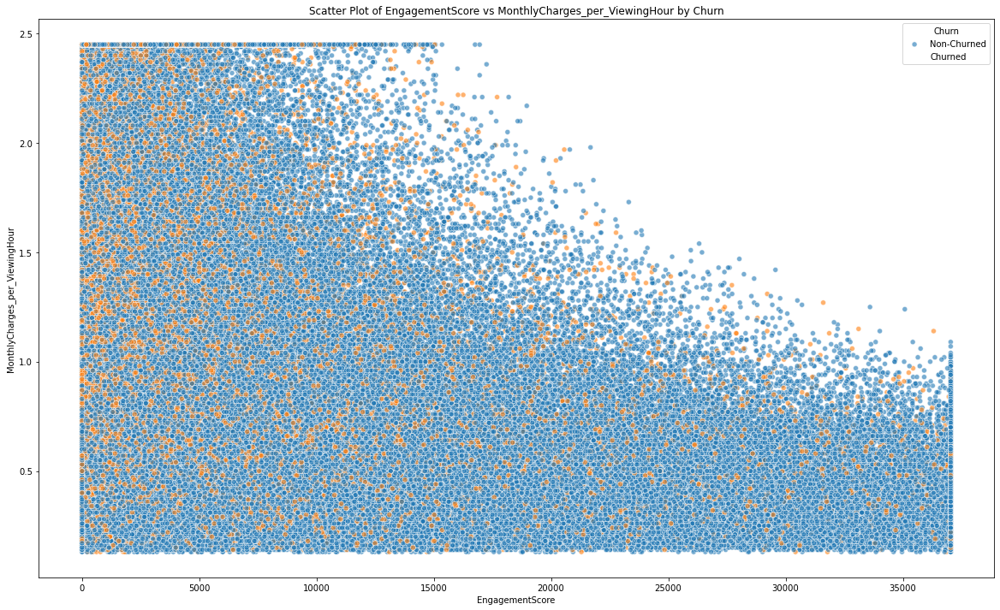

In [58]:
# Example scatter plot between EngagementScore and AccountAge_in_Years
plt.figure(figsize=(20, 12))  # Increase the dimensions of the plot
sns.scatterplot(x='EngagementScore', y='MonthlyCharges_per_ViewingHour', hue='Churn', data=X, alpha=0.6)
plt.title('Scatter Plot of EngagementScore vs MonthlyCharges_per_ViewingHour by Churn')
plt.xlabel('EngagementScore')
plt.ylabel('MonthlyCharges_per_ViewingHour')
plt.legend(title='Churn', loc='upper right', labels=['Non-Churned', 'Churned'])
plt.show()

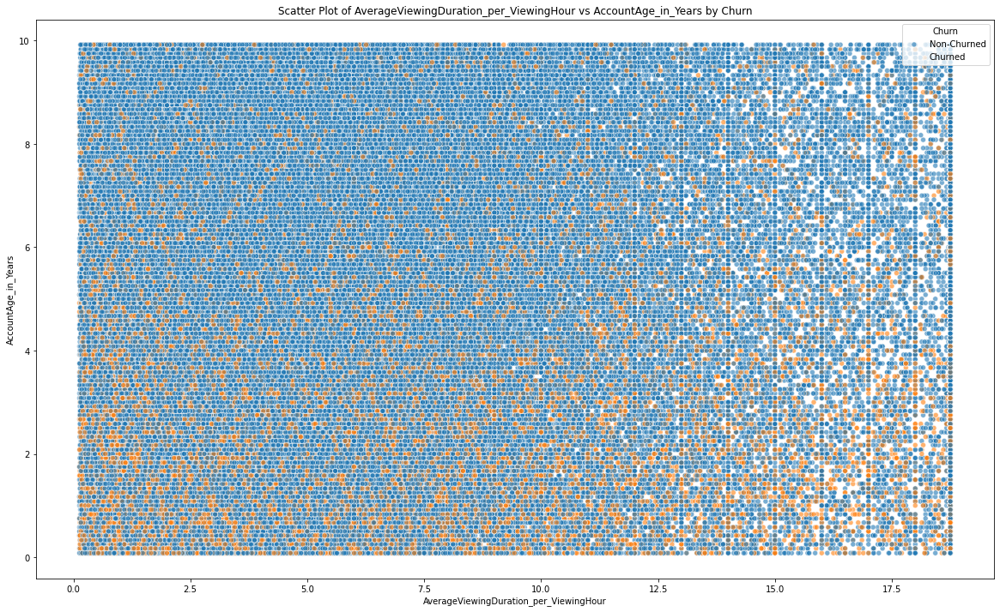

In [59]:
# Example scatter plot between EngagementScore and AccountAge_in_Years
plt.figure(figsize=(20, 12))  # Increase the dimensions of the plot
sns.scatterplot(x='AverageViewingDuration_per_ViewingHour', y='AccountAge_in_Years', hue='Churn', data=X, alpha=0.6)
plt.title('Scatter Plot of AverageViewingDuration_per_ViewingHour vs AccountAge_in_Years by Churn')
plt.xlabel('AverageViewingDuration_per_ViewingHour')
plt.ylabel('AccountAge_in_Years')
plt.legend(title='Churn', loc='upper right', labels=['Non-Churned', 'Churned'])
plt.show()

#### Correlation Analysis

Analyze the correlation between features and the target variable. Features with high correlation (positive or negative) with the target variable are often good candidates for selection.

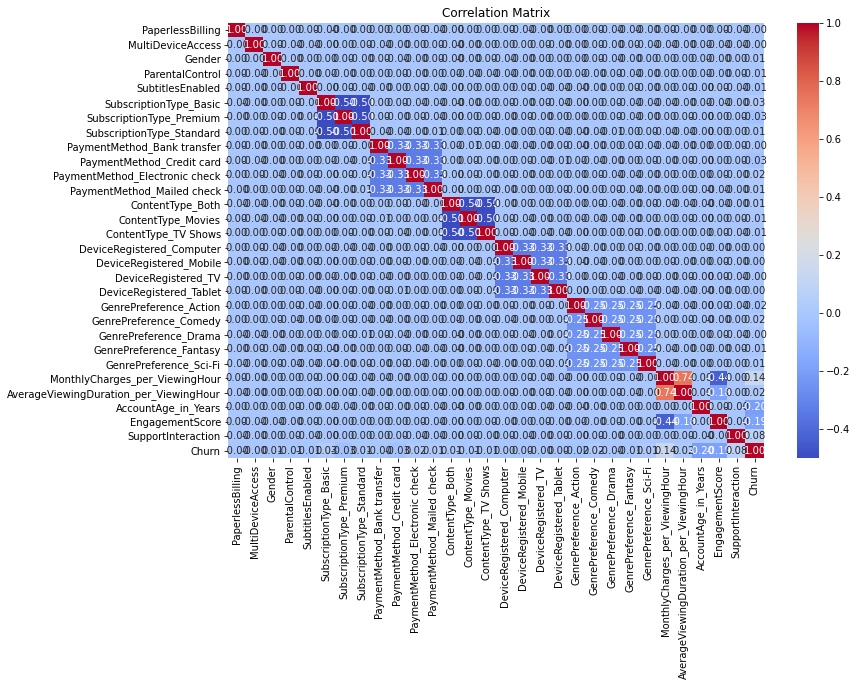

Churn                                     1.000000
MonthlyCharges_per_ViewingHour            0.144905
SupportInteraction                        0.076458
SubscriptionType_Basic                    0.028010
AverageViewingDuration_per_ViewingHour    0.017498
PaymentMethod_Electronic check            0.016913
GenrePreference_Comedy                    0.015876
PaymentMethod_Mailed check                0.014441
ContentType_Both                          0.013345
GenrePreference_Sci-Fi                    0.013183
Gender                                    0.007467
SubscriptionType_Standard                 0.005692
DeviceRegistered_Mobile                   0.001708
DeviceRegistered_Tablet                   0.001374
DeviceRegistered_Computer                 0.000177
PaperlessBilling                         -0.000923
MultiDeviceAccess                        -0.001285
PaymentMethod_Bank transfer              -0.002938
DeviceRegistered_TV                      -0.003267
GenrePreference_Drama          

In [60]:
# Calculate correlation matrix
corr_matrix = X.corr()

# Plot heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

# Correlation with target variable
corr_with_target = corr_matrix['Churn'].sort_values(ascending=False)
print(corr_with_target)

In [61]:
# Select features with absolute correlation above 0.1
selected_features = corr_with_target[abs(corr_with_target) > 0.1].index.tolist()
selected_features.remove('Churn')  # Remove the target variable from the list
print("Selected Features: ", selected_features)

Selected Features:  ['MonthlyCharges_per_ViewingHour', 'EngagementScore', 'AccountAge_in_Years']


In [62]:
X['SupportInteraction'] = X['SupportInteraction'].astype(int)
test_df_X['SupportInteraction'] = test_df_X['SupportInteraction'].astype(int)

In [63]:
columns_to_drop = ['ContentType_Both','GenrePreference_Sci-Fi','Gender','SubscriptionType_Standard','DeviceRegistered_Mobile',
                   'DeviceRegistered_Tablet','DeviceRegistered_Computer','PaperlessBilling','MultiDeviceAccess',
                   'PaymentMethod_Bank transfer','DeviceRegistered_TV','GenrePreference_Drama','ParentalControl',
                   'GenrePreference_Fantasy','ContentType_Movies','ContentType_TV Shows','SubtitlesEnabled',
                   'GenrePreference_Action']

train_df = train_df.drop(columns=columns_to_drop, axis=1)
test_df = test_df.drop(columns=columns_to_drop, axis=1)

X = X.drop(columns=columns_to_drop, axis=1)
test_df_X = test_df_X.drop(columns=columns_to_drop, axis=1)

In [64]:
X = X.drop('Churn', axis = 1)

#### Generate training and test datasets: 

In [65]:
# RandomUnderSampler uygulama
rus = RandomUnderSampler(random_state=42)
X_res, y_res = rus.fit_resample(X, y)

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X_res, y_res, test_size=0.2, random_state=42)

In [68]:
# Standardize the data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [104]:
test_df_scaled = scaler.fit_transform(test_df_X)

#### Apply Dimensionality Reduction

When making churn predictions, dimensionality reduction can be a useful step to improve model performance, reduce overfitting, and speed up computation. The choice of dimensionality reduction method depends on the nature of your data and the specific requirements of our model.

In [69]:
# Sınıf sayısını belirleyin
n_classes = len(set(y_train))

In [73]:
# Sınıf sayısını belirleyin
n_classes = len(set(y_train))

# n_components değerini sınıf sayısına göre ayarlayın
n_components = min(2, n_classes - 1)

In [76]:
# LDA uygulama
lda = LDA(n_components=n_components)
X_lda = lda.fit_transform(X_train, y_train)
X_lda_test = lda.transform(test_df_X)

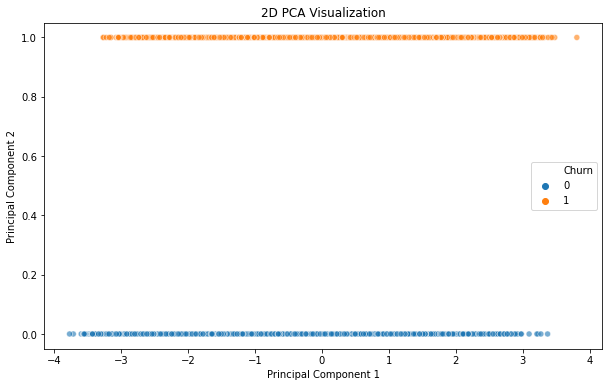

In [79]:
# Seaborn 2D scatter plot
plt.figure(figsize=(10, 6))
sns.scatterplot(x = X_lda[:, 0], y = y_train, hue=y_train, cmap='bwr', alpha=0.6)
plt.title('2D PCA Visualization')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()

### Model Selection

#### Comparison of models' 'ROC AUC Mean', 'ROC AUC Std', 'Accuracy Mean', 'Accuracy Std' information

In [84]:
models = []
models.append(('Gradient Boosting Classifier', GradientBoostingClassifier(random_state=15)))
# Initialize storage for results
acc_results = []
auc_results = []
names = []
model_results = pd.DataFrame(columns=['Name', 'ROC AUC Mean', 'ROC AUC Std', 'Accuracy Mean', 
                                      'Accuracy Std'])

# Iterate over each model
i = 0
for name, model in models:
    kfold = model_selection.KFold(n_splits=10, shuffle=True)
    
    # accuracy scoring
    cv_acc_results = model_selection.cross_val_score(model, X_train, y_train, 
                                                     cv=kfold, scoring='accuracy')
    # roc_auc scoring
    cv_auc_results = model_selection.cross_val_score(model, X_train, y_train, 
                                                     cv=kfold, scoring='roc_auc')
    
    acc_results.append(cv_acc_results)
    auc_results.append(cv_auc_results)
    names.append(name)
    
    model_results.loc[i] = [name, round(cv_auc_results.mean()*100, 2), 
                            round(cv_auc_results.std()*100, 2), 
                            round(cv_acc_results.mean()*100, 2),
                            round(cv_acc_results.std()*100, 2)]
    i += 1
    
# Sort results by ROC AUC Mean in descending order
model_results.sort_values(by=['ROC AUC Mean'], ascending=False)

,Name,ROC AUC Mean,ROC AUC Std,Accuracy Mean,Accuracy Std
0,Gradient Boosting Classifier,74.08,0.43,67.79,0.45


In [86]:
models = []
models.append(('Gradient Boosting Classifier w/LDA', GradientBoostingClassifier(random_state=15)))
# Initialize storage for results
acc_results = []
auc_results = []
names = []
model_results = pd.DataFrame(columns=['Name', 'ROC AUC Mean', 'ROC AUC Std', 'Accuracy Mean', 
                                      'Accuracy Std'])

# Iterate over each model
i = 0
for name, model in models:
    kfold = model_selection.KFold(n_splits=10, shuffle=True)
    
    # accuracy scoring
    cv_acc_results = model_selection.cross_val_score(model, X_lda, y_train, 
                                                     cv=kfold, scoring='accuracy')
    # roc_auc scoring
    cv_auc_results = model_selection.cross_val_score(model, X_lda, y_train, 
                                                     cv=kfold, scoring='roc_auc')
    
    acc_results.append(cv_acc_results)
    auc_results.append(cv_auc_results)
    names.append(name)
    
    model_results.loc[i] = [name, round(cv_auc_results.mean()*100, 2), 
                            round(cv_auc_results.std()*100, 2), 
                            round(cv_acc_results.mean()*100, 2),
                            round(cv_acc_results.std()*100, 2)]
    i += 1
    
# Sort results by ROC AUC Mean in descending order
model_results.append(by=['ROC AUC Mean'], ascending=False)

,Name,ROC AUC Mean,ROC AUC Std,Accuracy Mean,Accuracy Std
0,Gradient Boosting Classifier w/LDA,73.53,0.44,67.33,0.33


#### Compare Baseline Classification Algorithms:

In [87]:
def evaluate_and_plot_roc(model, X_train, X_test, y_train, y_test, model_name):
    # Model eğitimi
    model.fit(X_train, y_train)
    
    # Tahmin olasılıklarını elde etme
    if hasattr(model, "predict_proba"):
        y_prob = model.predict_proba(X_test)[:, 1]
    else:  # SVM gibi modeller için
        y_prob = model.decision_function(X_test)
    
    # ROC eğrisi hesaplama
    fpr, tpr, thresholds = roc_curve(y_test, y_prob)
    roc_auc = auc(fpr, tpr)
    
    # ROC eğrisini çizme
    plt.figure()
    plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.0])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc="lower right")
    plt.show()
    
    # Tahminler
    y_pred = (y_prob >= 0.5).astype(int)
    
    # Performans metrikleri
    acc = accuracy_score(y_test, y_pred)
    prec = precision_score(y_test, y_pred)
    rec = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    f2 = fbeta_score(y_test, y_pred, beta=2.0)
    
    return pd.DataFrame([[model_name, acc, prec, rec, f1, f2]], 
                        columns=['Model', 'Accuracy', 'Precision', 'Recall', 'F1 Score', 'F2 Score'])

In [88]:
# Initialize results DataFrame
results = pd.DataFrame(columns=['Model', 'Accuracy', 'Precision', 'Recall', 'F1 Score', 'F2 Score'])

**Gradient Boosting Classifier**

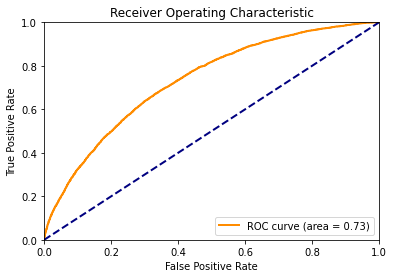

In [95]:
classifier_gb = GradientBoostingClassifier(random_state=15)
results = pd.concat([results, evaluate_and_plot_roc(classifier_gb, X_train, X_test, y_train, y_test, 
                                             'Gradient Boosting Classifier')], ignore_index=True)

In [94]:
results

,Model,Accuracy,Precision,Recall,F1 Score,F2 Score
0,Gradient Boosting Classifier,0.668647,0.657481,0.695514,0.675963,0.687559


#### Hyperparameter Tuning

In [97]:
# Hyperparametre grid
param_grid = {
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 4, 5],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Modeli tanımlayın
gbc = GradientBoostingClassifier()

# Grid Search CV
grid_search = GridSearchCV(estimator=gbc, param_grid=param_grid, cv=5, scoring='roc_auc', n_jobs=-1, verbose=2)
grid_search.fit(X_train, y_train)

# En iyi parametreler
print("En iyi parametreler:", grid_search.best_params_)

# En iyi model
best_model = grid_search.best_estimator_

# Test seti üzerinde değerlendirme
y_pred = best_model.predict(X_test)
y_pred_proba = best_model.predict_proba(X_test)[:, 1]

# Performans metrikleri
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Precision:", precision_score(y_test, y_pred))
print("Recall:", recall_score(y_test, y_pred))
print("F1 Score:", f1_score(y_test, y_pred))
print("ROC AUC:", roc_auc_score(y_test, y_pred_proba))

Fitting 5 folds for each of 243 candidates, totalling 1215 fits
[CV] END learning_rate=0.01, max_depth=3, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   7.0s
[CV] END learning_rate=0.01, max_depth=3, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   7.1s
[CV] END learning_rate=0.01, max_depth=3, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   7.1s
[CV] END learning_rate=0.01, max_depth=3, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   7.0s
[CV] END learning_rate=0.01, max_depth=3, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   7.1s
[CV] END learning_rate=0.01, max_depth=3, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=  14.0s
[CV] END learning_rate=0.01, max_depth=3, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=  14.0s
[CV] END learning_rate=0.01, max_depth=3, min_samples_leaf=1, min_samples_split=2, n_estimators=

1. En iyi parametreler: 
    - {'learning_rate': 0.1, 'max_depth': 3, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 100}
    - Accuracy: 0.6686470887794942
    - Precision: 0.657481162540366
    - Recall: 0.6955135504440901
    - F1 Score: 0.6759628154050464
    - ROC AUC: 0.7318239927013007

### Make predictions (required)

Remember you should create a dataframe named `prediction_df` with exactly 104,480 entries plus a header row attempting to predict the likelihood of churn for subscriptions in `test_df`. Your submission will throw an error if you have extra columns (beyond `CustomerID` and `predicted_probaility`) or extra rows.

The file should have exactly 2 columns:
`CustomerID` (sorted in any order)
`predicted_probability` (contains your numeric predicted probabilities between 0 and 1, e.g. from `estimator.predict_proba(X, y)[:, 1]`)

The naming convention of the dataframe and columns are critical for our autograding, so please make sure to use the exact naming conventions of `prediction_df` with column names `CustomerID` and `predicted_probability`!

In [98]:
params = {
    'learning_rate': 0.1,
    'max_depth': 3,
    'min_samples_leaf': 2,
    'min_samples_split': 2,
    'n_estimators': 100
}
model = GradientBoostingClassifier(**params)
model.fit(X_train, y_train)

GradientBoostingClassifier(min_samples_leaf=2)

### Example prediction submission:

The code below is a very naive prediction method that simply predicts churn using a Dummy Classifier. This is used as just an example showing the submission format required. Please change/alter/delete this code below and create your own improved prediction methods for generating `prediction_df`.

**PLEASE CHANGE CODE BELOW TO IMPLEMENT YOUR OWN PREDICTIONS**

In [ ]:
### PLEASE CHANGE THIS CODE TO IMPLEMENT YOUR OWN PREDICTIONS

# Fit a dummy classifier on the feature columns in train_df:
#dummy_clf = DummyClassifier(strategy="stratified")
#dummy_clf.fit(train_df.drop(['CustomerID', 'Churn'], axis=1), train_df.Churn)

In [ ]:
### PLEASE CHANGE THIS CODE TO IMPLEMENT YOUR OWN PREDICTIONS

# Use our dummy classifier to make predictions on test_df using `predict_proba` method:

In [ ]:
### PLEASE CHANGE THIS CODE TO IMPLEMENT YOUR OWN PREDICTIONS

# Combine predictions with label column into a dataframe
#prediction_df = pd.DataFrame({'CustomerID': test_df[['CustomerID']].values[:, 0], 'predicted_probability': predicted_probability})

In [111]:
predicted_probabilities = model.predict_proba(test_df_scaled)[:, 1]

In [112]:
prediction_df = pd.DataFrame({
    'CustomerID': test_df.CustomerID,
    'predicted_probability': predicted_probabilities
})

In [114]:
### PLEASE CHANGE THIS CODE TO IMPLEMENT YOUR OWN PREDICTIONS

# View our 'prediction_df' dataframe as required for submission.
# Ensure it should contain 104,480 rows and 2 columns 'CustomerID' and 'predicted_probaility'
print(prediction_df.shape)
prediction_df.head(10)

(104480, 2)


,CustomerID,predicted_probability
0,O1W6BHP6RM,0.502545
1,LFR4X92X8H,0.450079
2,QM5GBIYODA,0.805712
3,D9RXTK2K9F,0.481584
4,ENTCCHR1LR,0.572732
5,7A88BB5IO6,0.458627
6,70OMW9XEWR,0.761465
7,EL1RMFMPYL,0.723019
8,4IA2QPT6ZK,0.448183
9,AEDCWHSJDN,0.475593


**PLEASE CHANGE CODE ABOVE TO IMPLEMENT YOUR OWN PREDICTIONS**

## Final Tests - **IMPORTANT** - the cells below must be run prior to submission

Below are some tests to ensure your submission is in the correct format for autograding. The autograding process accepts a csv `prediction_submission.csv` which we will generate from our `prediction_df` below. Please run the tests below an ensure no assertion errors are thrown.

In [115]:
# FINAL TEST CELLS - please make sure all of your code is above these test cells

# Writing to csv for autograding purposes
prediction_df.to_csv("prediction_submission.csv", index=False)
submission = pd.read_csv("prediction_submission.csv")

assert isinstance(submission, pd.DataFrame), 'You should have a dataframe named prediction_df.'

In [116]:
# FINAL TEST CELLS - please make sure all of your code is above these test cells

assert submission.columns[0] == 'CustomerID', 'The first column name should be CustomerID.'
assert submission.columns[1] == 'predicted_probability', 'The second column name should be predicted_probability.'

In [117]:
# FINAL TEST CELLS - please make sure all of your code is above these test cells

assert submission.shape[0] == 104480, 'The dataframe prediction_df should have 104480 rows.'

In [118]:
# FINAL TEST CELLS - please make sure all of your code is above these test cells

assert submission.shape[1] == 2, 'The dataframe prediction_df should have 2 columns.'

In [119]:
# FINAL TEST CELLS - please make sure all of your code is above these test cells

## This cell calculates the auc score and is hidden. Submit Assignment to see AUC score.

## SUBMIT YOUR WORK!

Once we are happy with our `prediction_df` and `prediction_submission.csv` we can now submit for autograding! Submit by using the blue **Submit Assignment** at the top of your notebook. Don't worry if your initial submission isn't perfect as you have multiple submission attempts and will obtain some feedback after each submission!